# Trabajo Final de Master

Este notebook contiene los códigos y desarrollos para estudiar diferentes modelos de movilidad y aplocarlos para el caso puntual de la ciudad de Bogotá

### Primera Parte. Tratamiento de datos de la encuesta de movilidad del 2019

En esta primera parte se hace un primer llamado a la encuesta de movilidad del año 2019 de Bogotá, en donde se estudiará la calidad de la fuente de datos y se crearan matrices origen destino para todos los medios de transporte, y así verificar si los datos se ajustan a diferentes modelos de movilidad urbana.

In [85]:
# Calling the libreries 
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import LineString
from pyproj import Geod
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score
from numba import njit
from datetime import datetime, timedelta, time

# Declaring the paths of the trips data
trips_path = r'./Encuesta de Movilidad 2019/EODH/Archivos_CSV/ViajesEODH2019.csv'
# Path of the population data
houses_path = r'./Encuesta de Movilidad 2019/EODH/Archivos_CSV/HogaresEODH2019.csv'
# Path to the duration data
dur_path = r'./Encuesta de Movilidad 2019/EODH/Archivos_CSV/Aux_DuracionEODH2019.csv'
# Path of the ZATs shapefiles
shape_path = r'./Encuesta de Movilidad 2019/Zonificacion_(shapefiles)/ZONAS/ZONAS/ZAT.shp'
# Path of the streets shapefile
streets_path = r'./Encuesta de Movilidad 2019/Zonificacion_(shapefiles)/Malla_Vial_Integral_Bogota_D_C/Malla_Vial_Integral_Bogota_D_C.shp'
# Path of the "Localidades" shapefile
loc_path = r'./Encuesta de Movilidad 2019/Zonificacion_(shapefiles)/loca/Loca.shp'
# Converting the CSV in a pandas dataframe
trips_df = pd.read_csv(trips_path, sep = ';')
# Converting the population data to dataframe
houses_df = pd.read_csv(houses_path, sep= ';', low_memory=False)
# Converting the duration data to dataframe
duration_df = pd.read_csv(dur_path, sep = ';')
# Calling the ZAT's shapefile
zats_map = gpd.read_file(shape_path)
# Calling the streets shapefile
streets_map = gpd.read_file(streets_path)
# Calling the "Localidades" shapefile
loc_map = gpd.read_file(loc_path)

# Computing the centroid of each zat
zats_map['center'] = zats_map.to_crs('+proj=cea').centroid.to_crs(zats_map.crs)
zats_map = zats_map[(zats_map['MUNCod']==11001.0)|(zats_map['MUNCod']==25754.0)]

# Function which plots the place where a zat is located in Bogotá 
def one_zat(zat):
    df = zats_map[zats_map['ZAT']==zat]
    x_center = df['center'].x.iloc[0]
    y_center = df['center'].y.iloc[0]
    x_max = x_center+0.06
    x_min = x_center-0.06
    y_max = y_center+0.06
    y_min = y_center-0.06
    fig, ax = plt.subplots(1, 1, figsize=(25, 25))
    streets_map.plot(ax = ax, color='grey')
    df.plot(color='g', ax=ax)
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    plt.title('ZAT number {}'.format(zat), fontsize=40)
    plt.show()

# Function which plots the zat of origin and destination of a trip
def org_dest(zat_origin, zat_destination):
    x_origin = zats_map[zats_map['ZAT'] == zat_origin ]['center'].x.iloc[0]
    x_destination = zats_map[zats_map['ZAT'] == zat_destination]['center'].x.iloc[0]
    y_origin = zats_map[zats_map['ZAT'] == zat_origin ]['center'].y.iloc[0]
    y_destination = zats_map[zats_map['ZAT'] == zat_destination]['center'].y.iloc[0]
    x_max = max([x_origin, x_destination])+0.03
    x_min = min([x_origin, x_destination])-0.03
    y_max = max([y_origin, y_destination])+0.03
    y_min = min([y_origin, y_destination])-0.03
    fig, ax = plt.subplots(1, 1, figsize=(25, 25))
    streets_map.plot(ax = ax, color='grey')
    zats_map[zats_map['ZAT'] == zat_origin ].plot(color='g', ax=ax)
    zats_map[zats_map['ZAT'] == zat_destination].plot(color='r', ax=ax)
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    plt.title('ZAT of origin: {}, ZAT of destination: {}'.format(zat_origin, zat_destination), fontsize=40)
    plt.show()

### Estadistica 
En esta seccion revisaremos la estadistica de la encuesta, de esta manera verificar si el muestreo es coerente con la realidad.

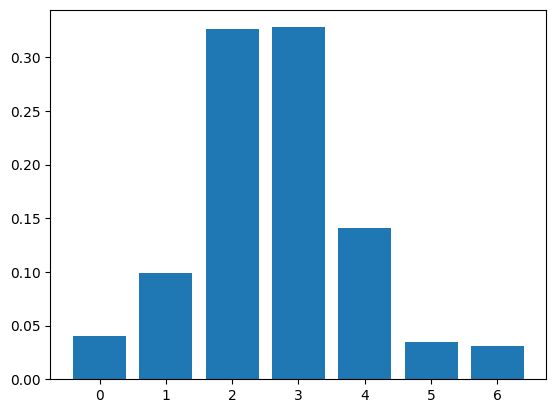

In [87]:
# Population per socioeconomic level
strata, counts = np.unique(houses_df['p5_estrato'], return_counts=True)
counts = counts/sum(counts)

plt.bar(strata, counts)
plt.show()

In [92]:
counts

array([0.04026938, 0.09932197, 0.32669049, 0.32788162, 0.14069086,
       0.03431373, 0.03083196])

In [88]:
# Population per district 
loc = houses_df[houses_df['municipio'] == 11001]['localidad']
loc, loc_counts = np.unique(loc, return_counts=True)
loc_counts = loc_counts/sum(loc_counts)
loc_dict = {'District': loc, 'Population': loc_counts}
pd.DataFrame(loc_dict).sort_values(by='Population', ascending=False)

,District,Population
8,KENNEDY,0.107251
14,SUBA,0.105656
18,USAQUEN,0.076665
6,ENGATIVA,0.069374
19,USME,0.065102
7,FONTIBON,0.057356
2,BOSA,0.054964
13,SANTA FE,0.050863
15,TEUSAQUILLO,0.050066
5,CIUDAD BOLIVAR,0.049667


In [89]:
houses_df[houses_df['municipio'] == 11001]

,Id_Hogar,Estado,p1_encuestador,p2_supervisor,p3_nro_mapa,p4_nro_manzana,Utam,Sector,Seccion,Manzana,...,p1mc_bicicleta_ninos,p1mc_bicicleta_sin_motor,p1mc_vehiculo_traccion_animal,p1mc_vehiculo_traccion_humana,p1mc_otro,p1mc_otros_cual,vivienda,Factor,municipio,localidad
0,10003,2,9068,NaN,950,1.100119e+13,UTAM2,9124,1,17,...,0,0,0,0,0,NaN,9500004,36.267857,11001,SUBA
1,18369,2,9858,NaN,20,1.100113e+13,UPR2,3105,1,9,...,0,0,0,0,0,NaN,200012,59.583575,11001,UPR
2,20163,1,9544,NaN,2790,1.100115e+13,UTAM85,4524,2,20,...,0,0,0,0,0,NaN,27900029,646.438622,11001,BOSA
3,2913,1,8909,NaN,2781,1.100115e+13,UTAM85,4527,8,7,...,0,4,0,0,0,NaN,27810062,280.576688,11001,BOSA
4,14581,1,9447,NaN,63,1.100117e+13,UTAM100,7207,2,7,...,0,0,0,0,0,NaN,630084,87.328434,11001,TEUSAQUILLO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21823,33537,1,10619,NaN,4093,1.100119e+13,UPR1,9211,1,19,...,0,1,0,0,0,NaN,40930025,7.906290,11001,UPR
21824,2529,1,9235,NaN,16,1.100119e+13,UPR1,9211,1,12,...,1,2,0,0,0,NaN,160029,23.784754,11001,UPR
21825,2530,1,9235,NaN,16,1.100119e+13,UPR1,9211,1,12,...,2,2,0,0,0,NaN,160032,23.784754,11001,UPR
21826,32373,1,10602,NaN,15,1.100119e+13,UPR1,9211,1,27,...,0,0,0,0,0,NaN,150015,13.625352,11001,UPR


Ok como una primera aproximación no se van a filtrar los datos por tiempos de viaje, ni velocidades, por lo cual, en esta primera parte se tendrán en cuenta todos los datos.
La otra cuestión es que, como me sucedio en mi TFG, el muestreo sobre los de mas municipios está mal hecho, con los datos utilizados Bojaca tendría una población mayor a Faca y eso obviamente no es congruente con la vida real y el modelo estaría incorrecto, por lo cual, de nuevo, se van a utilizar solo datos en donde los viajes sean en Bogotá o Soacha.

In [90]:
# Filtering the data in order to take only the trips in Bogotá and Soacha
trips_df = trips_df[(trips_df['mun_origen'] == 11001) | (trips_df['mun_origen'] == 25754)]
trips_df = trips_df[(trips_df['mun_destino'] == 11001) | (trips_df['mun_destino'] == 25754)]
houses_df = houses_df[(houses_df['municipio'] == 11001) | (houses_df['municipio'] == 25754)]

# Filtering the data to avoid the ZAT number 0.0
trips_df = trips_df[(trips_df['zat_origen']>0)&(trips_df['zat_destino']>0)]

# Adding the socio-economic stratification of the person that relises a trip
trips_df = (trips_df.merge(houses_df[['Id_Hogar', 'p5_estrato']], left_on='id_hogar', right_on='Id_Hogar')
            .rename(columns={'p5_estrato': 'stratification'})
            .drop(columns='Id_Hogar'))

# Adding the information about the duration and the time of each trip
columns = ['id_hogar', 'id_persona', 'id_viaje']
dur_columns = ['id_hogar', 'id_persona', 'id_viaje', 'hora_inicio_viaje', 'p31_hora_llegada', 'duracion']
trips_df = (trips_df.merge(duration_df[dur_columns], left_on=columns, right_on=columns)
                    .rename(columns={'hora_inicio_viaje_y': 'hora_inicio', 'p31_hora_llegada_y': 'hora_llegada'})
                    .drop(columns=['hora_inicio_viaje_x', 'p31_hora_llegada_x']))
trips_df['hora_inicio'] = pd.to_datetime(trips_df['hora_inicio'], format='%H:%M').dt.time
trips_df['hora_llegada'] = pd.to_datetime(trips_df['hora_llegada'], format='%H:%M').dt.time
# Filtering the occasional travels 
# trips_df = trips_df[(trips_df['p32_ocasional'] != 1)]

In [91]:
# Number of surveys, zones and trips
num_surv = len(houses_df)
num_trips = len(trips_df)
num_nodes = len(set(trips_df['zat_origen']).union(set(trips_df['zat_destino'])))
info_dict = {'Number of surveys': num_surv, 'Number of trips': num_trips, 'Number of ZATs': num_nodes}
info_dict

{'Number of surveys': 18719, 'Number of trips': 105215, 'Number of ZATs': 900}

In [6]:
# Computing the population per zat
population = houses_df[['zat_hogar', 'p7_total_personas']]
population = population.groupby('zat_hogar').agg('sum').sort_values(by='p7_total_personas', ascending=False)

Dado que el modelo gravitacional escala como $r^{-\alpha}$, no podemos tener en cuenta viajes dentro de una misma ZAT, por lo cual estos serán filtrados.

In [7]:
# Computing the number of trips between diferent zats 
num_trips_df = trips_df[['zat_origen', 'zat_destino', 'stratification']]
#num_trips_df['trips'] = np.ones(len(num_trips_df)) 
num_trips_df.loc[0:, ['trips']] = 1
num_trips_df = (num_trips_df.groupby(['zat_origen', 'zat_destino'], as_index=False)['trips']
                            .agg('sum')
                            .sort_values(by='trips', ascending=False))
num_trips_df = num_trips_df[num_trips_df['zat_destino'] != num_trips_df['zat_origen']]

In [8]:
num_trips_df

,zat_origen,zat_destino,trips
39546,530.0,551.0,73.0
41121,551.0,530.0,66.0
52049,775.0,776.0,56.0
52157,776.0,775.0,56.0
49364,714.0,1050.0,53.0
...,...,...,...
22936,317.0,163.0,1.0
22937,317.0,164.0,1.0
22939,317.0,168.0,1.0
22940,317.0,172.0,1.0


Dado que el modelo gravitacional es simetrico, debemos sumar los viajes de "ida y de regreso" entre dos ZATs, por lo cual, vamos a convertir el numero de viajes en una matriz y la sumamos con su transpuesta para simetrizar esta matriz, y luego la convertimos en columna de nuevo. 

In [9]:
# Symmetrizing the number of trips between each zat
table = pd.pivot_table(num_trips_df, values='trips', index='zat_origen', columns='zat_destino').fillna(0)
table = table + table.T

sim_num_trips = (table.stack()
                      .to_frame()
                      .reset_index()
                      .rename(columns={'level_0': 'zat_origen', 'level_1': 'zat_destino', 0: 'trips'})
                      .sort_values(by='trips', ascending=False))
sim_num_trips = sim_num_trips[sim_num_trips['trips']>0]
#sim_num_trips

In [10]:
# Adding the centroid coordinates to the df

num_dis_trips = (num_trips_df.merge(zats_map[['ZAT', 'center']], left_on='zat_origen', right_on='ZAT')
                             .rename(columns={'center': 'Origin_center'})
                             .drop(columns='ZAT'))
num_dis_trips = (num_dis_trips.merge(zats_map[['ZAT', 'center']], left_on='zat_destino', right_on='ZAT')
                             .rename(columns={'center': 'Destination_center'})
                             .drop(columns='ZAT'))
#num_dis_trips.sort_values(by='trips', ascending=False)

In [11]:
num_dis_trips

,zat_origen,zat_destino,trips,Origin_center,Destination_center
0,530.0,551.0,73.0,POINT (-74.17593 4.63213),POINT (-74.18166 4.62800)
1,782.0,551.0,1.0,POINT (-74.22095 4.58524),POINT (-74.18166 4.62800)
2,743.0,551.0,2.0,POINT (-74.10280 4.51207),POINT (-74.18166 4.62800)
3,553.0,551.0,13.0,POINT (-74.18640 4.64169),POINT (-74.18166 4.62800)
4,1006.0,551.0,6.0,POINT (-74.19105 4.63951),POINT (-74.18166 4.62800)
...,...,...,...,...,...
58754,334.0,750.0,1.0,POINT (-74.09055 4.63033),POINT (-74.09868 4.49578)
58755,129.0,478.0,1.0,POINT (-74.09645 4.70498),POINT (-74.06191 4.60071)
58756,70.0,31.0,1.0,POINT (-74.04353 4.72669),POINT (-74.07474 4.75450)
58757,498.0,268.0,1.0,POINT (-74.08799 4.57558),POINT (-74.06032 4.62488)


In [12]:
# Adding the centroid coordinates to the symmetrical df

num_dis_sim = (sim_num_trips.merge(zats_map[['ZAT', 'center']], left_on='zat_origen', right_on='ZAT')
                             .rename(columns={'center': 'Origin_center'})
                             .drop(columns='ZAT'))
num_dis_sim = (num_dis_sim.merge(zats_map[['ZAT', 'center']], left_on='zat_destino', right_on='ZAT')
                             .rename(columns={'center': 'Destination_center'})
                             .drop(columns='ZAT')
                             .sort_values(by='trips', ascending=False))
num_dis_sim

,zat_origen,zat_destino,trips,Origin_center,Destination_center
0,551.0,530.0,139.0,POINT (-74.18166 4.62800),POINT (-74.17593 4.63213)
17384,530.0,551.0,139.0,POINT (-74.17593 4.63213),POINT (-74.18166 4.62800)
35596,775.0,776.0,112.0,POINT (-74.19736 4.58356),POINT (-74.19802 4.57757)
39726,776.0,775.0,112.0,POINT (-74.19802 4.57757),POINT (-74.19736 4.58356)
43984,714.0,1050.0,105.0,POINT (-74.16040 4.55118),POINT (-74.15788 4.52832)
...,...,...,...,...,...
49497,702.0,598.0,1.0,POINT (-74.10799 4.53523),POINT (-74.08685 4.55899)
20290,449.0,327.0,1.0,POINT (-74.09126 4.58509),POINT (-74.10070 4.64560)
49494,996.0,598.0,1.0,POINT (-74.11375 4.65307),POINT (-74.08685 4.55899)
49493,327.0,598.0,1.0,POINT (-74.10070 4.64560),POINT (-74.08685 4.55899)


In [13]:
# Calculating the distances in meters
distance = []
geod = Geod(ellps = 'WGS84')
for i in range(len(num_dis_sim)):
    line = LineString([num_dis_sim['Origin_center'].iloc[i], num_dis_sim['Destination_center'].iloc[i]])
    dist = geod.geometry_length(line)
    distance.append(dist)

num_dis_sim['distance'] = distance
num_dis_sim

,zat_origen,zat_destino,trips,Origin_center,Destination_center,distance
0,551.0,530.0,139.0,POINT (-74.18166 4.62800),POINT (-74.17593 4.63213),782.916312
17384,530.0,551.0,139.0,POINT (-74.17593 4.63213),POINT (-74.18166 4.62800),782.916312
35596,775.0,776.0,112.0,POINT (-74.19736 4.58356),POINT (-74.19802 4.57757),666.616844
39726,776.0,775.0,112.0,POINT (-74.19802 4.57757),POINT (-74.19736 4.58356),666.616844
43984,714.0,1050.0,105.0,POINT (-74.16040 4.55118),POINT (-74.15788 4.52832),2542.549034
...,...,...,...,...,...,...
49497,702.0,598.0,1.0,POINT (-74.10799 4.53523),POINT (-74.08685 4.55899),3521.911272
20290,449.0,327.0,1.0,POINT (-74.09126 4.58509),POINT (-74.10070 4.64560),6772.989588
49494,996.0,598.0,1.0,POINT (-74.11375 4.65307),POINT (-74.08685 4.55899),10823.725590
49493,327.0,598.0,1.0,POINT (-74.10070 4.64560),POINT (-74.08685 4.55899),9700.477783


### Casos particulares

Analizando los dataframes, se encontro que, a la hora de introducir las poblaciones de cada ZAT en el dataframe "num_dis_sim", hay una cantidad considerable de viajes que se borran, lo cual sucede debido a que, en estas zonas no hay hogares en los cuales se realizó la encuesta, es decir, su población es cero, pero los viajes hacía estas zonas existen. 

Al revisar cuales zonas son estas zonas con población cero, se observó que son zonas rurales a las afueras de la ciudad, como por ejemplo la conejera en Suba, en donde hay una cantidad considerable de equipamentos deportivos, pero ahí no vive nadie.
Este tipo de comportamientos podrían repetirse en zonas como viveros, poligonos industriales o campus universitarios en donde normalmente no vive nadie, pero al ser zonas de trabajo o estudio se realizan muchos viajes a estas.

En estos casos particulares, el modelo gravitacional no es capaz de predecir este tipo de viajes dado que la población de estas zonas en principio es cero, pero al tener puestos de trabajo o una oferta de equipamentos, la gente va a viajar a dichas zonas.

[]

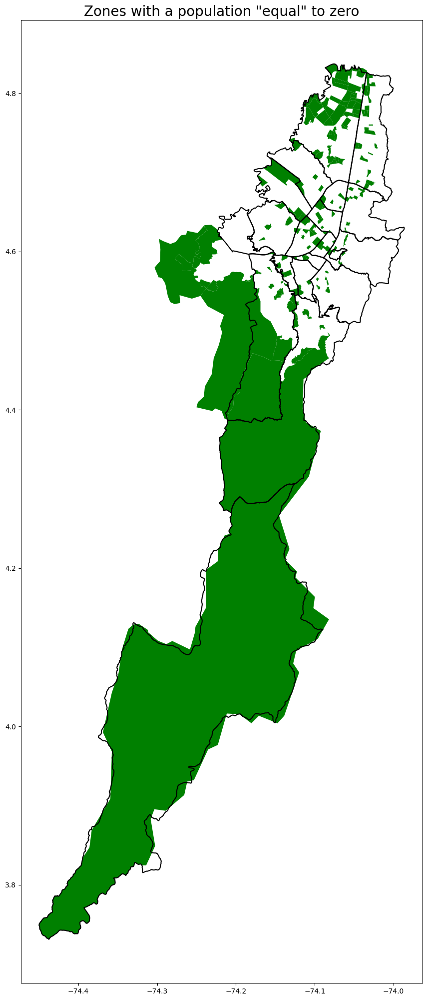

In [14]:
# Ploting the ZATs whit population equal to zero
mask = zats_map['ZAT'].isin(list(set(num_dis_sim['zat_origen'].unique())-set(population.index)))
pltn_zero = zats_map[mask]

fig, ax = plt.subplots(1, 1, figsize=(25, 25))
loc_map.boundary.plot(ax=ax, color='black')
pltn_zero.plot(color='g', ax=ax)
plt.title('Zones with a population "equal" to zero', fontsize = 20)
plt.plot()

In [15]:
num_trips_df[num_trips_df['zat_origen']==1]

,zat_origen,zat_destino,trips
1,1.0,33.0,14.0
0,1.0,9.0,2.0
5,1.0,669.0,2.0
4,1.0,41.0,2.0
2,1.0,38.0,1.0
3,1.0,39.0,1.0
6,1.0,1028.0,1.0


En el mapa aparecen zonas bastante importantes en la ciudad, como el aeropuerto, el parque Simon Bolivar (el mas grande de la ciudad), y equipamentos como bibliotecas.

El modelo gravitcional no es capas de modelar los viajes que se realizan desde y hacia estas zonas.

In [16]:
# Adding the number of person in the survey per zat 
num_dis_sim = (num_dis_sim.merge(population, left_on='zat_origen', right_on='zat_hogar')
                          .rename(columns={'p7_total_personas': 'Origin Population'}))
num_dis_sim = (num_dis_sim.merge(population, left_on='zat_destino', right_on='zat_hogar')
                          .rename(columns={'p7_total_personas': 'Dest Population'})
                          .sort_values(by='trips', ascending=False)
                          .drop(columns=['Origin_center', 'Destination_center']))
num_dis_sim = num_dis_sim[['zat_origen', 'zat_destino', 'Origin Population', 'Dest Population', 'distance', 'trips']]
# Droping the repeated values
num_dis_sim = num_dis_sim.iloc[::2]
num_dis_sim.head(10)

,zat_origen,zat_destino,Origin Population,Dest Population,distance,trips
0,551.0,530.0,145,518,782.916312,139.0
26753,775.0,776.0,184,311,666.616844,112.0
37196,1050.0,714.0,229,64,2542.549034,105.0
30741,782.0,783.0,187,230,860.003059,100.0
26756,777.0,776.0,274,311,899.246606,96.0
14130,743.0,744.0,471,115,906.773827,83.0
312,1006.0,553.0,178,244,570.037103,79.0
30638,782.0,784.0,187,265,1412.350471,77.0
8099,778.0,782.0,106,187,809.763373,75.0
33248,161.0,159.0,213,109,840.169254,74.0


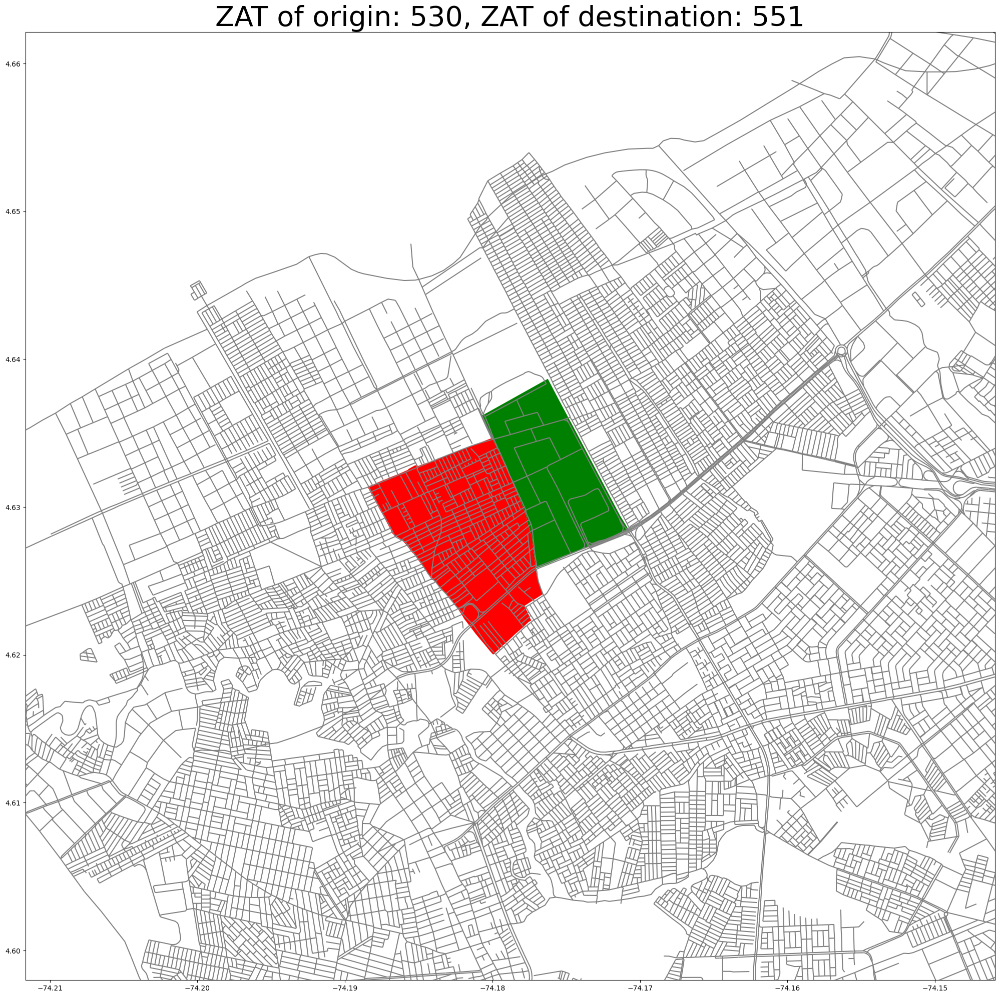

In [17]:
org_dest(530, 551)

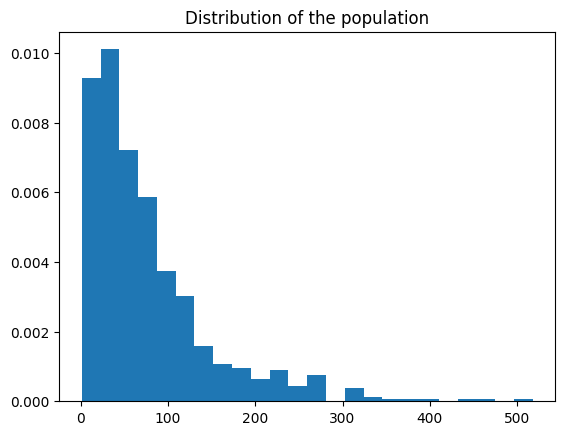

In [18]:
# Distribution of the population 
pltn_y, pltn_x = np.histogram(population['p7_total_personas'], bins=int(len(population)/30), density=True)
plt.stairs(pltn_y, pltn_x, fill=True)
plt.title('Distribution of the population')
plt.show()

[]

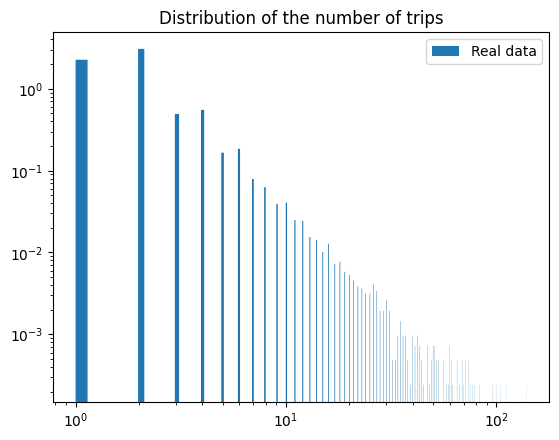

In [19]:
# Distribution of the number of trips between two zats
# In other words the distribution of weights of each trip
bins = int(len(num_dis_sim)/30)
data_trips_y, data_trips_x = np.histogram(num_dis_sim['trips'], bins=bins, density=True)
plt.stairs(data_trips_y, data_trips_x, fill=True, label='Real data')
plt.xscale('log')
plt.yscale('log')
plt.title('Distribution of the number of trips')
plt.legend()
plt.plot()

En la figura anterior podemos ver que el numero de personas que viajan entre dos zonas, la cual parece seguir una ley de potencias de la forma $ax^{-\alpha}$, por lo cual el modelo que de razón de la cantidad de viajes entre dos zonas debe seguir un mecanismo, el cual de como resultado una ley de potencias. 

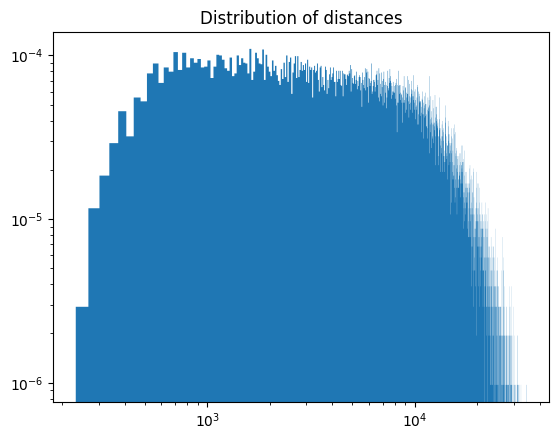

In [20]:
# Distribution of distances 
dist_y, dist_x = np.histogram(num_dis_sim['distance'], bins = bins, density=True)
plt.stairs(dist_y, dist_x, fill=True)
plt.xscale('log')
plt.yscale('log')
plt.title('Distribution of distances')
plt.show()


### Fitting

Con los datos organozados debidamente, se va a definir la función del modelo y se ajustarán los datos utilizando el metodo curve_fit de scipy para obtener un primer estimado de los parametros del modelo, posteriormente se usarán tecnicas mas rigurosas como el most likelyhood estimator y, usando los resultados del curve_fit aplicar inferencia bayesiana.

La función a ajustar es

$T_{ij} = K\frac{P_iP_j}{d_{ij}^{\alpha}}$

In [21]:
# Declaring the gravity function
def gravity(Data, K, a):
    P_1, P_2, d = Data
    T = K*(P_1*P_2)/(d**a)
    return T

# Spliting the data
ppltn_1 = np.array(num_dis_sim['Origin Population'])
ppltn_2 = np.array(num_dis_sim['Dest Population'])
dist = np.array(num_dis_sim['distance'])
# Tupple with the free parameters
data = (ppltn_1, ppltn_2, dist)
# Array with the number of trips between zats
trips = np.array(num_dis_sim['trips'])

# Fiting the data with the model
popt, pcov = curve_fit(gravity, data, trips)
print(popt)
print(np.sqrt(np.diag(pcov)))

# Computing the R^2 value
theo_trips = gravity(data, popt[0], popt[1])
r2_score(trips, theo_trips)

[1.01094651 1.0786711 ]
[0.0625607  0.00869141]


0.13332535918476585

El ajuste obtenido nos da unos parametros $K=0.80027608$ y $\alpha=1.05438672$, por lo cual el modelo sería $T_{ij} = 0.8\frac{P_iP_j}{d_{ij}^{1.05}}$, pero al calcular el $R^2$, obtenemos un valor de $0.1$, dandonos a entender que el ajuste a este modelo no es el mejor precisamente.

[]

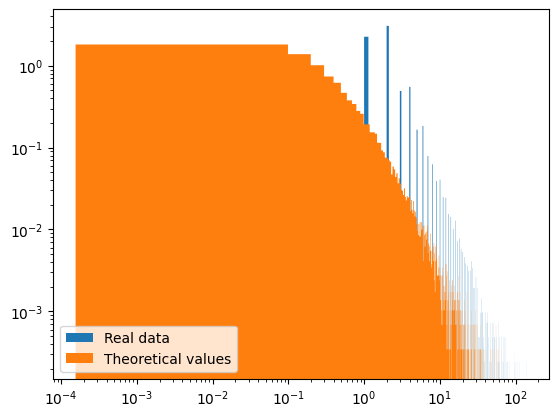

In [22]:
# Comparation between the distribution of trips given by the data and the model.
bins = int(len(num_dis_sim)/30)
data_trips_y, data_trips_x = np.histogram(num_dis_sim['trips'], bins=bins, density=True)
theo_trips_y, theo_trips_x = np.histogram(theo_trips, bins=bins, density=True)
plt.stairs(data_trips_y, data_trips_x, fill=True, label='Real data')
plt.stairs(theo_trips_y, theo_trips_x, fill=True, label='Theoretical values')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.plot()

Los datos serán ajustados a un modleo gravitacional modificado de la forma

$T_{ij} = K\frac{(P_iP_j)^{\beta}}{d_{ij}^{\alpha}}$

In [23]:
# Declaring the modified gravity function 
def mod_gravity(Data, K, a, b):
    P_1, P_2, d = Data
    T = K*(P_1*P_2)**b/(d**a)
    return T

# Fiting the data with the model
popt_mod, pcov_mod = curve_fit(mod_gravity, data, trips)
print(popt_mod)
print(np.sqrt(np.diag(pcov_mod)))

# Computing the R^2 value
mod_theo_trips = mod_gravity(data, popt_mod[0], popt_mod[1], popt_mod[2])
r2_score(trips, mod_theo_trips)

[39.01998953  0.76418057  0.41347317]
[2.32266518 0.00618356 0.00523229]


0.2735421026123078

El ajuste obtenido nos da unos parametros $K=38.26$, $\alpha=0.75$ y $\beta=0.4$, por lo cual el modelo sería $T_{ij} = 38.26\frac{(P_iP_j)^{0.4}}{d_{ij}^{0.75}}$, al calcular el $R^2$, obtenemos un valor de $0.26$, obteniendo una mejor con respect al modelo anterior, pero de todas formas el ajuste no es satisfactorio. 

[]

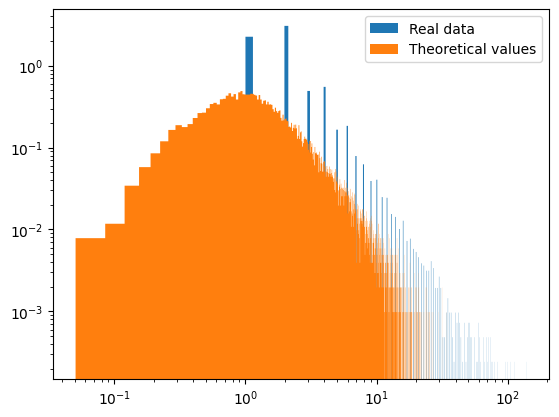

In [24]:
# Comparation between the distribution of trips given by the data and the modified model.
bins = int(len(num_dis_sim)/30)
data_trips_y, data_trips_x = np.histogram(num_dis_sim['trips'], bins=bins, density=True)
theo_trips_y, theo_trips_x = np.histogram(mod_theo_trips, bins=bins, density=True)
plt.stairs(data_trips_y, data_trips_x, fill=True, label='Real data')
plt.stairs(theo_trips_y, theo_trips_x, fill=True, label='Theoretical values')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.plot()

### Discución sobre el modelo gravitacional
Despues de mostrar los resultados obtnidos a mi director de TFM, Albert Diaz, llegamos a la conclusión de que este modelo no es valido para el tipo de datos que tenemos, porque basicamente estamos haciendo esto mal, esté tipo de modelo serviría para viajes entre zonas residenciales, pero no contempla los viajes entre una zona residencial y una zona de trabajo, razon por la cual ya no vamos a tomar la población de las zonas, si no que vamos a ajustar el modelo para que tome el numero de viajes de origen, y numero de viajes de destino de una determinada zona, por lo cual, nuestro gravitacional modificado sería.

$T_{ij}=\frac{O_iD_j}{R^{\alpha}}$ 

Como podemos observar, en ninguno de los dos casos de modelo gravitacional se ajustan a los datos de una manera satisfactoria, razón por la cual se debe seguir investigando y buscando que tipo de modelo que ajusta de una mejor manera.

### Analisis de redes complejas

Se calcularan las estadisticas de la red de movilidad, tales como la distribución del grado, de fuerza nodal total, de salida y entrada, distribución de los pesos de los links, tanto dirigidos como no dirigidos.

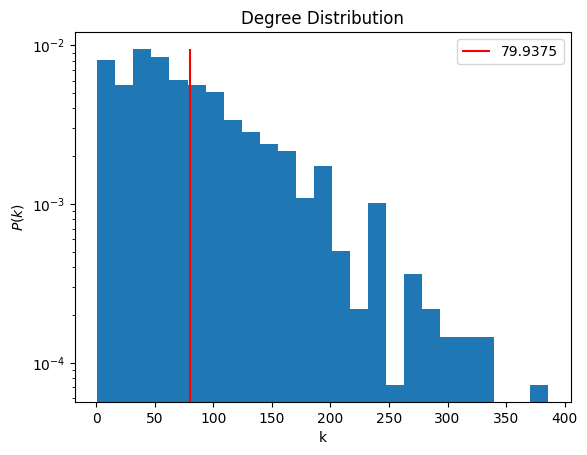

In [25]:
# Non directed Degree distribution
sim_num_trips.loc[:, ['counts']]=1
degree_dist = (sim_num_trips.groupby('zat_origen', as_index=False)['counts']
                            .agg('sum')
                            .sort_values(by='counts', ascending=False))
bins = int(len(degree_dist)/30)
y_degree, x_degree =np.histogram(degree_dist['counts'],bins=25 ,density=True)
k_mean = np.mean(degree_dist['counts'])

# Ploting the degree distribution
plt.stairs(y_degree, x_degree, fill=True)
plt.vlines(k_mean, 0, max(y_degree), label=k_mean, color='r')
plt.xlabel('k')
plt.ylabel(r'$P(k)$')
# plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.title('Degree Distribution')
plt.show()

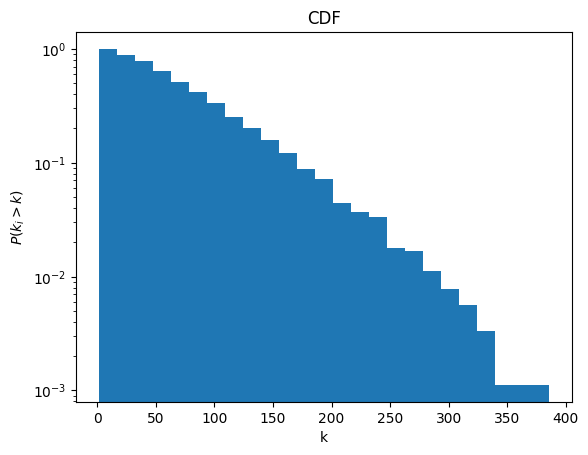

In [26]:
# Computing the complmentary cumulative degree distribution
cdf = []
bin_weight = x_degree[1]-x_degree[0]
my_degree = list(y_degree*bin_weight)
for i in range(len(y_degree)):
    p = sum(my_degree[i:])
    cdf.append(p)

# Ploting the CDF 
plt.stairs(cdf, x_degree, fill=True)
plt.xlabel('k')
plt.ylabel(r'$P(k_i>k)$')
#plt.xscale('log')
plt.yscale('log')
plt.title('CDF')
plt.show()

[]

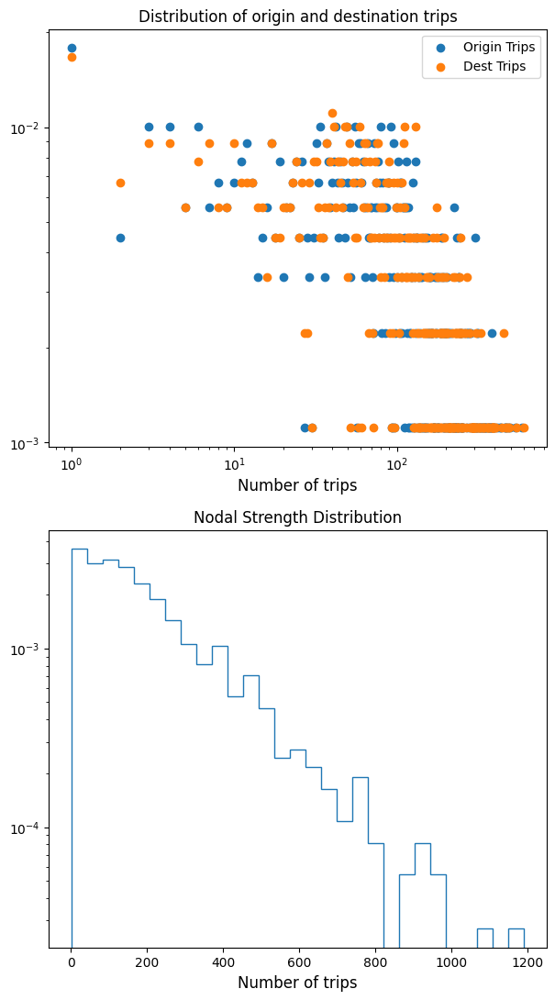

In [27]:
# Counting the number of origin trips of each ZAT

origin_trips = (num_trips_df.groupby('zat_origen', as_index=False)['trips']
                .agg('sum')
                .sort_values(by='trips', ascending=False))
dest_trips = (num_trips_df.groupby('zat_destino', as_index=False)['trips']
                .agg('sum')
                .sort_values(by='trips', ascending=False))
total_trips = origin_trips.merge(dest_trips, left_on='zat_origen', right_on='zat_destino')
total_trips['trips']=total_trips[['trips_x', 'trips_y']].sum(axis=1)
total_trips = (total_trips.drop(columns=['trips_x', 'trips_y', 'zat_destino'])
                          .rename(columns={'zat_origen': 'ZAT'}))
# Adding the mising zats that only have one trip
miss_zats = list(set(origin_trips['zat_origen'])^set(dest_trips['zat_destino']))
new_data= pd.DataFrame({'ZAT': miss_zats,
           'trips':np.ones(len(miss_zats))})
total_trips = pd.concat([total_trips, new_data], ignore_index=True)

# Distribution of number of trips per origin and destination
# In other words the nodal strenght
bins = int(len(origin_trips)/30)
org_y, org_x = np.histogram(origin_trips['trips'], bins=bins, density=True)
dest_y, dest_x = np.histogram(dest_trips['trips'], bins=bins, density=True)
# Distribution of number of trips per each ZAT
tot_y, tot_x = np.histogram(total_trips['trips'], bins=bins, density=True)

org_x, org_y = np.unique(origin_trips['trips'], return_counts=True)
org_y = org_y/sum(org_y)
dest_x, dest_y = np.unique(dest_trips['trips'], return_counts=True)
dest_y = dest_y/sum(dest_y)

# Ploting the distributions 
fig, ax = plt.subplots(2, figsize = (7,13))
# Distributon of origin and destination trips
# ax[0].stairs(org_y, org_x, label='Origin Trips')
# ax[0].stairs(dest_y, dest_x, label='Destination Trips')

ax[0].scatter(org_x, org_y, label='Origin Trips')
ax[0].scatter(dest_x, dest_y, label='Dest Trips')
ax[0].set_xlabel('Number of trips', fontsize = 12)
ax[0].legend()
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_title('Distribution of origin and destination trips')
# Distributions of trips per ZAT
ax[1].stairs(tot_y, tot_x)
ax[1].set_xlabel('Number of trips', fontsize = 12)
#ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_title('Nodal Strength Distribution')

plt.plot()

In [28]:
num_dis_trips = (num_dis_trips.merge(origin_trips, left_on='zat_origen', right_on='zat_origen')
                              .rename(columns={'trips_x': 'Trips', 'trips_y': 'Origin Trips'}))
num_dis_trips = (num_dis_trips.merge(dest_trips, left_on='zat_destino', right_on='zat_destino')
                              .rename(columns={'trips': 'Destination Trips'})
                              .sort_values(by='Trips', ascending=False))
num_dis_trips = num_dis_trips[['zat_origen', 'zat_destino', 'Origin Trips', 'Destination Trips', 'Origin_center', 'Destination_center', 'Trips']]
num_dis_trips

,zat_origen,zat_destino,Origin Trips,Destination Trips,Origin_center,Destination_center,Trips
0,530.0,551.0,496.0,305.0,POINT (-74.17593 4.63213),POINT (-74.18166 4.62800),73.0
35259,551.0,530.0,308.0,482.0,POINT (-74.18166 4.62800),POINT (-74.17593 4.63213),66.0
24211,776.0,775.0,332.0,192.0,POINT (-74.19802 4.57757),POINT (-74.19736 4.58356),56.0
15528,775.0,776.0,187.0,343.0,POINT (-74.19736 4.58356),POINT (-74.19802 4.57757),56.0
29410,714.0,1050.0,108.0,201.0,POINT (-74.16040 4.55118),POINT (-74.15788 4.52832),53.0
...,...,...,...,...,...,...,...
28674,131.0,294.0,196.0,211.0,POINT (-74.08976 4.70036),POINT (-74.09502 4.64497),1.0
28675,309.0,294.0,70.0,211.0,POINT (-74.15421 4.69371),POINT (-74.09502 4.64497),1.0
28676,273.0,294.0,98.0,211.0,POINT (-74.06067 4.64133),POINT (-74.09502 4.64497),1.0
28677,388.0,294.0,34.0,211.0,POINT (-74.12899 4.64522),POINT (-74.09502 4.64497),1.0


In [29]:
total_trips

,ZAT,trips
0,276.0,1191.0
1,322.0,1081.0
2,530.0,978.0
3,275.0,970.0
4,354.0,941.0
...,...,...
895,1908.0,2.0
896,308.0,1.0
897,478.0,1.0
898,959.0,1.0


In [30]:
# Calculating the distances in meters
distance = []
geod = Geod(ellps = 'WGS84')
for i in range(len(num_dis_trips)):
    line = LineString([num_dis_trips['Origin_center'].iloc[i], num_dis_trips['Destination_center'].iloc[i]])
    dist = geod.geometry_length(line)
    distance.append(dist)

num_dis_trips['distance'] = distance
num_dis_trips = num_dis_trips[['zat_origen', 'zat_destino', 'Origin Trips', 'Destination Trips', 'distance','Trips']]
num_dis_trips

,zat_origen,zat_destino,Origin Trips,Destination Trips,distance,Trips
0,530.0,551.0,496.0,305.0,782.916312,73.0
35259,551.0,530.0,308.0,482.0,782.916312,66.0
24211,776.0,775.0,332.0,192.0,666.616844,56.0
15528,775.0,776.0,187.0,343.0,666.616844,56.0
29410,714.0,1050.0,108.0,201.0,2542.549034,53.0
...,...,...,...,...,...,...
28674,131.0,294.0,196.0,211.0,6152.547891,1.0
28675,309.0,294.0,70.0,211.0,8495.104690,1.0
28676,273.0,294.0,98.0,211.0,3832.489116,1.0
28677,388.0,294.0,34.0,211.0,3768.416246,1.0


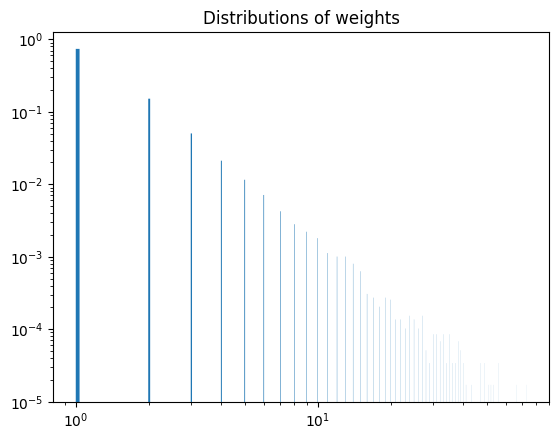

In [31]:
# Distribution of the weighted links in the non-directed network
bins = int(len(num_dis_trips)/30)
trips_y, trips_x = np.histogram(num_dis_trips['Trips'],bins = bins ,density=False)
trips_y = trips_y/sum(trips_y)
plt.stairs(trips_y, trips_x, fill=True)
plt.title('Distributions of weights')
plt.xscale('log')
plt.yscale('log')

plt.show()

Hay que hacer una distinción muy importante entre las distribuciones que tengo, el primer conjunto de estas, las que ajuste con el modelo gravitacional son distribuciones del peso de los links de la red no direccionada, mientras que el segundo conjunto de distribuciones son los de la fuerza nodal, de entrada, de salida y la suma total, el anterior grafico muestra la distribución de los pesos de los links de la red direccionada.

### Modelo gravitacional modificado

En esta sección trabajaremos en ajustar nuestros datos al modelo gravitacional modificado propuesto por Albert, el cual tiene la forma

$T_{ij}=\frac{O_iD_j}{R^{\alpha}}$ 

In [32]:
# Fiting the data with the new model
def origin_dest(Data, a):
    O_1, D_2, d = Data
    T = (O_1*D_2)/(d**a)
    T = T/sum(T)
    return T

# Spliting the dara 
origin = np.array(num_dis_trips['Origin Trips'])
dest = np.array(num_dis_trips['Destination Trips'])
distance = np.array(num_dis_trips['distance'])
# Tupple with the free parameters
data = (origin, dest, distance)
# Array with the number of non-simetrical (directed) trips between zats
trips = np.array(num_dis_trips['Trips'])
trips = trips/sum(trips)

# Fiting the data with the new model
popt, pcov = curve_fit(origin_dest, data, trips)
print(popt)
print(np.sqrt(np.diag(pcov)))

# Computing the R^2 value
theo_trips_1 = origin_dest(data, popt[0])
r2_score(trips, theo_trips_1)

[0.50075756]
[0.00335322]


-0.14402699547775177

In [33]:
# Fiting the data with the modified new model
def origin_dest(Data, K, a):
    O_1, D_2, d = Data
    T = K*(O_1*D_2)/(d**a)
    T = T/sum(T)
    return T

# Fiting the data with the new model
popt, pcov = curve_fit(origin_dest, data, trips)
print(popt)
print(np.sqrt(np.diag(pcov)))

# Computing the R^2 value
theo_trips_2 = origin_dest(data, popt[0], popt[1])
r2_score(trips, theo_trips_2)

[-4.29865766e+06  5.00754443e-01]
[2.40723658e+10 3.61916795e-03]


-0.14402699546636

En el siguiente caso vamos a ajustar los datos a una versión que sigue una ley de potencias del modelo gravitacional modificado, el cual está dado por.

$T_{ij} = K\frac{(O_iD_j)^{\beta}}{d_{ij}^{\alpha}}$

In [34]:
# Declaring the power modified gravity function 
def pow_mod(Data, K, a, b):
    O_1, D_2, d = Data
    T = K*(O_1*D_2)**b/(d**a)
    T = T/sum(T)
    return T

# Fiting the data with the model
popt_mod, pcov_mod = curve_fit(pow_mod, data, trips)
print(popt_mod)
print(np.sqrt(np.diag(pcov_mod)))

# Computing the R^2 value
mod_theo_trips = pow_mod(data, popt_mod[0], popt_mod[1], popt_mod[2])
r2_score(trips, mod_theo_trips)

[-1.82543376e+07  5.82388355e-01  3.47639700e-01]
[2.16566123e+12 3.79216306e-03 4.01464026e-03]


0.2294365032427651

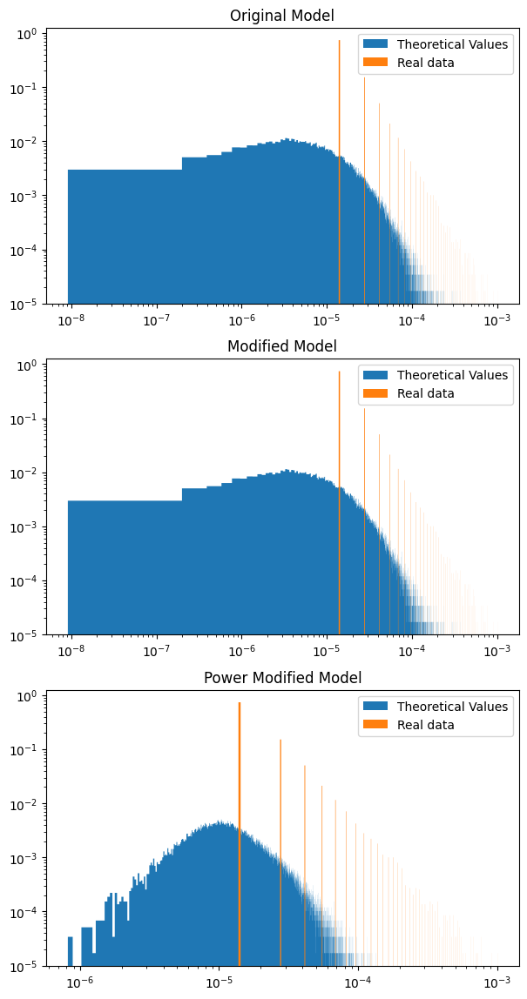

In [35]:
# Ploting the distribution given by the models compared with the real data
theo_1_y, theo_1_x = np.histogram(theo_trips_1, bins=bins,density=False)
theo_1_y = theo_1_y/sum(theo_1_y)
theo_2_y, theo_2_x = np.histogram(theo_trips_2, bins=bins,density=False)
theo_2_y = theo_2_y/sum(theo_2_y)
theo_3_y, theo_3_x = np.histogram(mod_theo_trips, bins=bins,density=False)
theo_3_y = theo_3_y/sum(theo_3_y)
trips_x_1 = trips_x/sum(trips_x)

fig, ax = plt.subplots(3, figsize= (7, 14))
ax[0].stairs(theo_1_y, theo_1_x, fill=True, label='Theoretical Values')
ax[0].stairs(trips_y, trips_x_1, fill=True, label='Real data')
ax[0].legend()
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_title('Original Model')

ax[1].stairs(theo_2_y, theo_2_x, fill=True, label='Theoretical Values')
ax[1].stairs(trips_y, trips_x_1, fill=True, label='Real data')
ax[1].legend()
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_title('Modified Model')

ax[2].stairs(theo_3_y, theo_3_x, fill=True, label='Theoretical Values')
ax[2].stairs(trips_y, trips_x_1, fill=True, label='Real data')
ax[2].legend()
ax[2].set_xscale('log')
ax[2].set_yscale('log')
ax[2].set_title('Power Modified Model')

plt.show()

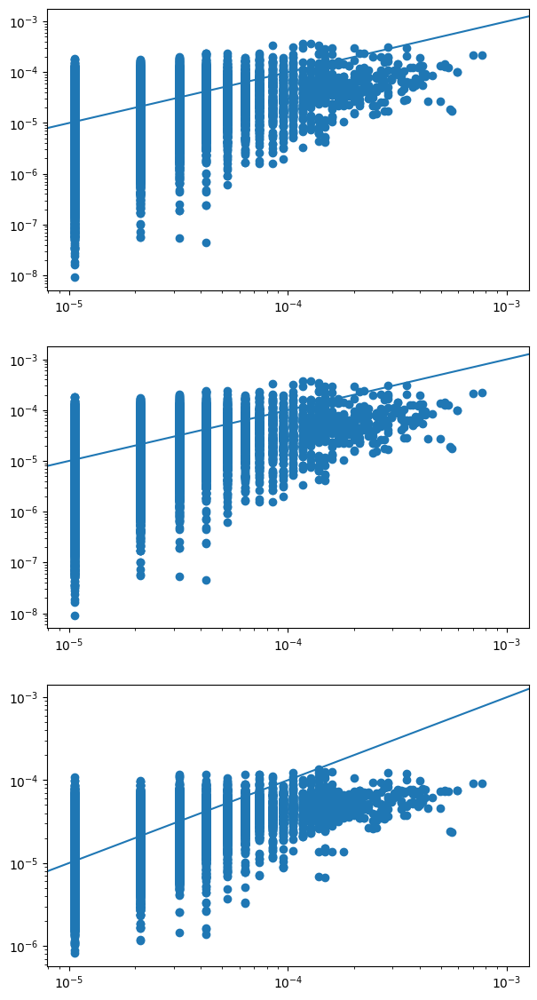

In [36]:
# Ploting the theoretical values vs the real data

fig, ax = plt.subplots(3, figsize=(7, 14))

ax[0].scatter(trips, theo_trips_1)
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].axline((1e-5, 1e-5), (1e-3, 1e-3))

ax[1].scatter(trips, theo_trips_2)
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].axline((1e-5, 1e-5), (1e-3, 1e-3))


ax[2].scatter(trips, mod_theo_trips)
ax[2].set_xscale('log')
ax[2].set_yscale('log')
ax[2].axline((1e-5, 1e-5), (1e-3, 1e-3))

#### Discusión
Como se ha visto, los dos primeros modelos no han arrojado resultados satisfactorios, para el caso del modelo gravitacional, concluimos que el conjunto de datos que tenemos no srve para ajustar con este modelo. Ahora con respecto al modelo modificado, todavía tenemos el comportamiento de que los viajes decrecen a medida que la distancia aumenta, ¿pero en verdad pasa esto?, tengo la hipotesis de que los viajes poco numerosos no presentan un comportamiento regular con respecto a la distancia, es decir, puedo encontrar distancias muy pequeñas entre dos zonas donde solo se hizo un solo viaje. 

Se procedio a normalizar los datos y ajustar al modelo con estos, pero no se tuvieron resultados satisfactorios.

### Analisis de numero pequeño de viajes
Se analizaran los patrones presentes en los viajes poco numeroso, se haran distribuciones de la distancia de los viajes y de la fuerza nodal. 

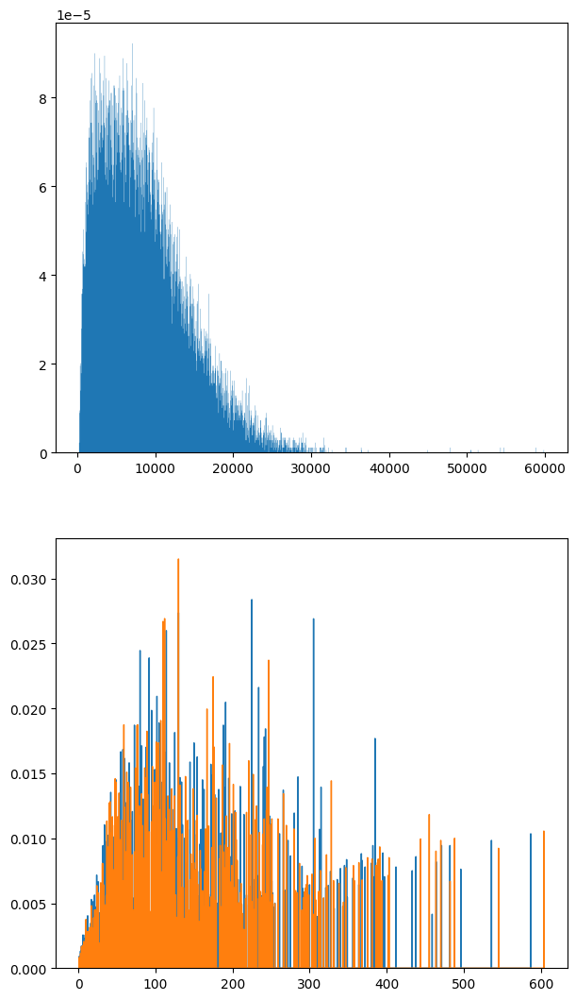

In [37]:
# Filtering the data to the low number of trips
low_num_trips = num_dis_trips[num_dis_trips['Trips']==1]
bins = int(len(low_num_trips)/30)
low_dis_y, low_dis_x = np.histogram(low_num_trips['distance'],bins=bins ,density=True)
low_or_y, low_or_x = np.histogram(low_num_trips['Origin Trips'],bins=bins ,density=True)
low_dest_y, low_dest_x = np.histogram(low_num_trips['Destination Trips'],bins=bins ,density=True)

# Ploting the distributions
fig, ax = plt.subplots(2, figsize=(7, 13))
# Distribution of distances
ax[0].stairs(low_dis_y, low_dis_x, fill=True)

ax[1].stairs(low_or_y, low_or_x)
ax[1].stairs(low_dest_y, low_dest_x)

plt.show()

Como podemos observar, para los viajes de una sola persona, se tienen distancias y fuerza nodal de todos los colores y sabores, no se sigue una tendencia tan clara de grandes distancias y baja fuerza nodal.
Lo que sucede a la hora de ajustar con los modelos propuestos es que, son tantos los viajes de una sola persona que el modelo va a tratar de ajustar miles de datos con parametros bastante diversos a un solo viaje entre dos ZATs, y es por eso que los dos modelos están fallando. 

### Modelo de radiaciones

La siguiente tarea es verificar si los datos se ajustan a un modelo de radiaciones, el cual está dado por.

$T_{ij} = T_i\frac{m_im_j}{(m_i+s_{ij})(m_i+m_j+s_{ij})}$

En donde $T_{ij}$ es el flujo de personas entre las zonas $i$ y $j$, $T_i$ el flujo de personas que la zona $i$ emite, $m_i$ y $m_j$ son las poblaciones de las zonas $i$ y $j$, y finalmente $s_{ij}$ se define como el numero de oportunidades entre las zonas $i$ y $j$, y segun la fuente que se use tiene diferentes definiciones, en Barthelemy (2016) $s_{ij}$ es el numero de nodos $w$ tal que $d(i,w)<d(i,j)$, mientras que en Simini et,al (2012), $s_{ij}$ denota la población en un radio dado por la distaincia $r_{ij}$, es decir, $s_{ij}=\sum_{w\neq i,j} m_w$ tal que $d(i,w)<d(i,j)$.
Cabe destacar que este modelo no es simetrico, es decir, $T_{ij}\neq T_{ji}$, a diferencia del modelo gravitacional.

Bueno ya descrito el modelo es hora de pasar a la discusión, como sabemos, nuestros datos no dan razon de la población en ciertas zonas a las que si viaja gente dado que estas zonas son poligonos industriales o tienen otros equipamentos, por lo cual se puede pensar en versiones modificadas del modelo de radiaciones que se adapte a nuestros datos, la primera es, en vez de usar la población $m_i$, se puede usar la fuerza nodal de cada ZAT, se podría usar la fuerza nodal total, la de salida y la de entrada. Como una primera propuesta, teniendo en cuenta que el modelo es antisimetrico por definición, utilizaré $m_i$ como la fuerza nodal total y $s_{ij}$ será la suma de todas las fuerzas nodales entre cada zona. 

In [38]:
# Calling the dataframe with all the information that we need
num_dis_trips_path = r'./Encuesta de Movilidad 2019/EODH/Archivos_CSV/num_dis_trips.csv'
num_dis_trips = pd.read_csv(num_dis_trips_path)
num_dis_trips = num_dis_trips.drop(columns='Unnamed: 0')

# Computing the theoretical values given by the radiation model
T_i = np.array(num_dis_trips['Origin Trips'])
m_i = np.array(num_dis_trips['Org Nodal Strength'])
m_j = np.array(num_dis_trips['Dest Nodal Strength'])
s_ij = np.array(num_dis_trips['s_ij'])
T_ij = T_i*(m_i*m_j)/((m_i+s_ij)*(m_i+m_j+s_ij))

num_dis_trips.loc[:, 'Theo Trips'] = T_ij
# num_dis_trips = num_dis_trips[['zat_origen', 'zat_destino', 'Origin Trips', 'Destination Trips', 'Org Nodal Strength', 'Dest Nodal Strength', 'distance', 's_ij', 'Trips', 'Theo Trips']]
# num_dis_trips

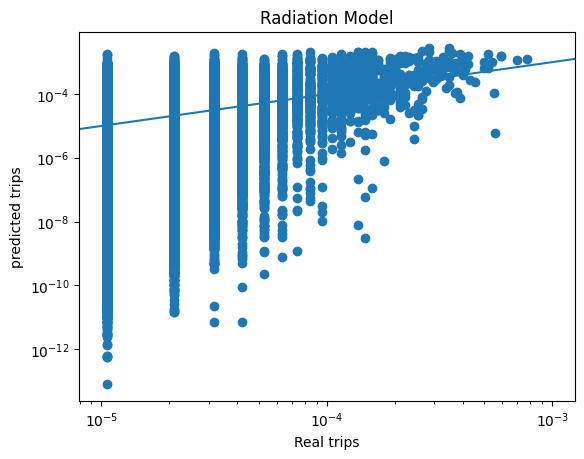

In [39]:
# Ploting the accuracy of the model

plt.scatter(num_dis_trips['Trips']/sum(num_dis_trips['Trips']), T_ij/sum(T_ij))
# plt.scatter(num_dis_trips['Trips'], T_ij)
plt.axline((1e-5, 1e-5), (1e-3, 1e-3))
# plt.axline((1, 1), (1e2, 1e2))
plt.xlabel('Real trips')
plt.ylabel('predicted trips')
plt.xscale('log')
plt.yscale('log')
plt.title('Radiation Model')
plt.show()

In [40]:
num_dis_trips.sort_values(by='Trips', ascending=True).head(20)

,zat_origen,zat_destino,Origin Trips,Destination Trips,Org Nodal Strength,Dest Nodal Strength,distance,Trips,s_ij,Theo Trips
29465,992.0,273.0,144.0,101.0,287.0,199.0,3134.523103,1.0,26289.0,0.011558
36698,510.0,786.0,17.0,158.0,34.0,314.0,13497.800627,1.0,159890.0,0.000007
36700,1050.0,422.0,209.0,134.0,410.0,268.0,10829.409406,1.0,65377.0,0.005285
36701,553.0,422.0,313.0,134.0,621.0,268.0,6744.395923,1.0,31372.0,0.050471
36702,161.0,422.0,302.0,134.0,602.0,268.0,12703.129630,1.0,111822.0,0.003846
36704,55.0,422.0,263.0,134.0,534.0,268.0,17685.410956,1.0,110324.0,0.003055
36706,773.0,422.0,282.0,134.0,572.0,268.0,7796.297988,1.0,45952.0,0.019858
36708,322.0,422.0,540.0,134.0,1088.0,268.0,4506.769980,1.0,27545.0,0.190273
36709,556.0,422.0,156.0,134.0,306.0,268.0,7713.243862,1.0,38802.0,0.008308
36711,932.0,422.0,280.0,134.0,560.0,268.0,10185.516664,1.0,43069.0,0.021942


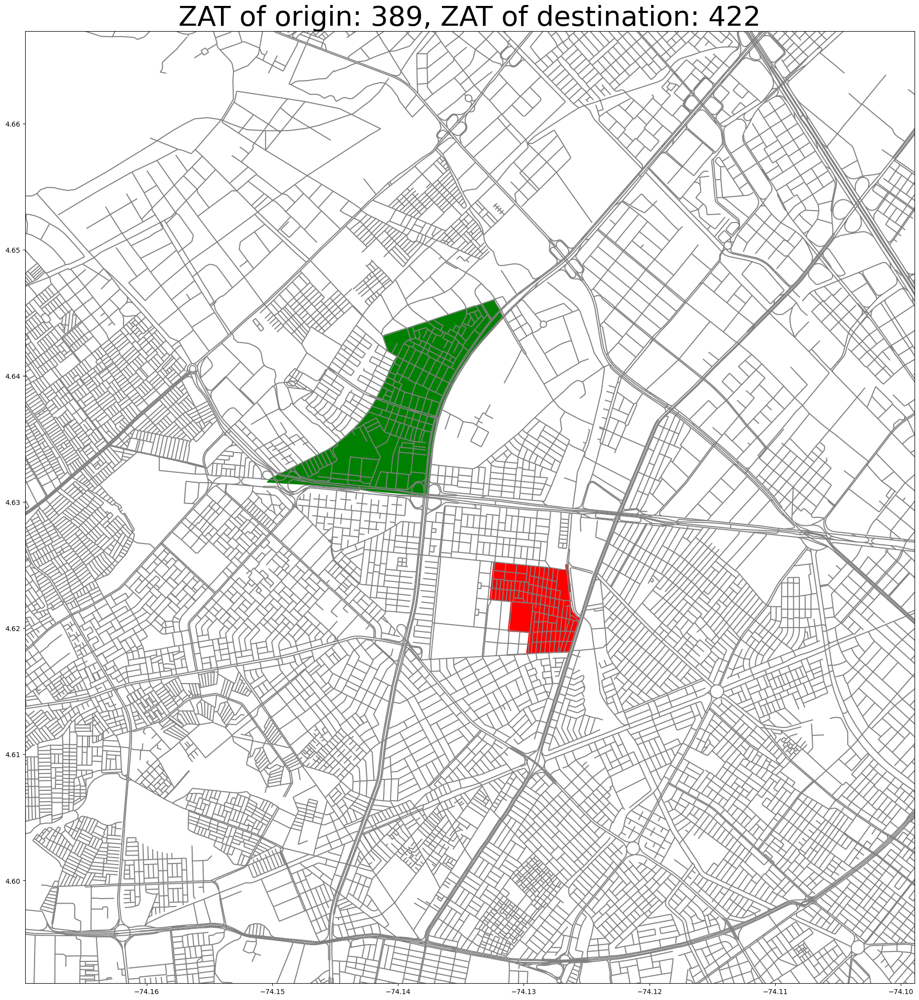

In [41]:
org_dest(389, 422)

### Discusión

Acá se puede ver desde dos perspectivas, la preocupante y la interesante, por el lado de la preocupante, el modelo de radiaciones muestra que hay viajes que son excesivamente poco probables, que se dan de todas formas, algo que se podría hacer es ver estos viajes en particular, ya que su valor $s_{ij}$ debe ser excesivamente grande cuando "no debería". Por otra parte está el comportamiento interesante, vemos que para viajes que tienen una probabilidad mayor a una milesima, los datos reales se aproximan bastante a los predecidos por el modelo, lo cual nos muestra que el comportamiento de los viajes se ajusta de manera gratificante al modelo de radiaciones cuando se tiene un numero considerble de viajes.

Como una primera revisión, muchos de los viajes en donde la cantidad $s_{ij}$ es sumamente pequeña son aquellos en donde el origen o destino es sumapaz, lo cual tiene sentido dado que, segun el modelo tienes todas las oportinidades que da toda la ciudad, y es inconsevible ir a Sumapaz. Como manera de lidiar con esto es eliminar a Sumapaz de este estudio dado que las caracterizticas de este viaje son particulares, aunque estadisticamente no es muy representativo. 

Otra de las hipotesis que pueden estár presentes es la dependencía de la dinámica de la hora del día, dado que dependiendo de la hora los nodos tienden a ser mas emisores o mas receptores, por lo cual, tener en cuenta estas difrencias tambíen podría dar razón de estas cantidades execivamente bajas.
Comentando el anterior comentario, es cierto que la hora del día influencia en esta dinamica, pero, como estamos trabajando con todos los viajes, se supne que estos son simetricos, es decir, los viajes que por ejemplo salen por la mañana, vuelven por la tarde, al no tener distinción de la hora, ese nodo que por la mañana es emisor por la tarde es receptor, y en este marco, cumple con ambos papeles, de todos modos no sobra hacer este estudio para ver de que mnera se comporta la movilidad en función a las tres ventanas de tiempo propuestas.

### Analisis rapido de viajes en función de la hora

In [42]:
# Filtering the data in function of the hour of the day
first = datetime.strptime('04:00', '%H:%M').time()
second = datetime.strptime('10:00', '%H:%M').time()
third = datetime.strptime('16:00', '%H:%M').time()
fourth = datetime.strptime('22:00', '%H:%M').time()

trips_df[(trips_df['hora_inicio']>first) & (trips_df['hora_inicio']<second)]

,id_hogar,id_persona,id_viaje,fecha,lugar_origen,zat_origen,p17_Id_motivo_viaje,p17_otro_motivo,p28_lugar_destino,zat_destino,...,mun_origen,mun_destino,utam_origen,utam_destino,modo_principal,modo_principal_desagregado,stratification,hora_inicio,hora_llegada,duracion
0,33754,2,1,43669.0,1.0,204.0,5,NaN,2.0,554.0,...,11001.0,11001.0,UTAM31,UTAM86,SITP Provisional,SITP - Provisional,3,08:00:00,08:30:00,30
2,33754,1,1,43669.0,1.0,204.0,5,NaN,2.0,195.0,...,11001.0,11001.0,UTAM31,UTAM74,SITP Provisional,SITP - Provisional,3,08:00:00,08:30:00,30
5,33770,2,1,43669.0,1.0,973.0,11,NaN,2.0,499.0,...,11001.0,11001.0,UTAM54,UTAM33,Transporte informal,Bus/buseta informal/pirata/Chana,2,08:15:00,08:30:00,15
7,33770,3,1,43670.0,1.0,973.0,5,NaN,2.0,656.0,...,11001.0,11001.0,UTAM54,UTAM54,A pie,A pie (Viajes totalmente a pie),2,08:05:00,08:20:00,15
8,33770,3,2,43670.0,2.0,656.0,6,NaN,1.0,973.0,...,11001.0,11001.0,UTAM54,UTAM54,A pie,A pie (Viajes totalmente a pie),2,08:35:00,08:50:00,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105196,10848,1,1,43591.0,1.0,316.0,4,NaN,2.0,997.0,...,11001.0,11001.0,UTAM75,UTAM109,SITP Provisional,SITP - Provisional,3,07:30:00,10:00:00,150
105199,P05633,2,1,43596.0,1.0,154.0,1,NaN,2.0,245.0,...,11001.0,11001.0,UTAM14,UTAM88,Auto,Vehículo privado como conductor,4,08:00:00,09:00:00,60
105201,21244,1,1,43628.0,1.0,1048.0,7,NaN,2.0,256.0,...,11001.0,11001.0,UTAM72,UTAM97,A pie,A pie (Viajes totalmente a pie),3,06:30:00,06:40:00,10
105206,13220,1,1,43598.0,1.0,88.0,1,NaN,2.0,327.0,...,11001.0,11001.0,UTAM15,UTAM109,Auto,Vehículo privado como conductor,5,06:15:00,07:15:00,60


In [43]:
# Analysing the number of trips that begin in a window of half an hour in function of the strata

# Declaring an hour array
hour_array = []

# Definir el tiempo inicial (00:15)
current_time = datetime.strptime('00:00', '%H:%M').time()

# Definir la cantidad de minutos para incrementar (30 minutos)
increment = timedelta(minutes=30)

# Continuar hasta alcanzar las 23:45
for _ in range(48):
    hour_array.append(current_time)
    
    # Convertir current_time a datetime para incrementar
    current_datetime = datetime.combine(datetime.today(), current_time)
    # Incrementar el tiempo
    new_datetime = current_datetime + increment
    # Convertir de nuevo a time
    current_time = new_datetime.time()

# Declaring our dataframe
hour_strata = trips_df[['stratification', 'hora_inicio']]
# Arrays with the quantity of trips that begins in a determinate hour in function of the strata
st = []
# Array of the strata
strata = [1, 2, 3, 4, 5, 6]

for i in strata:
    my_df = hour_strata[hour_strata['stratification']==i]
    st_array = []
    for j in range(len(hour_array)):
        if j < 47:
            st_hour = my_df[(my_df['hora_inicio']>hour_array[j]) & (my_df['hora_inicio']<hour_array[j+1])]
            st_array.append(len(st_hour))
        else:
            st_hour = my_df[(my_df['hora_inicio']>hour_array[j])& (my_df['hora_inicio']<hour_array[0])]
            st_array.append(len(st_hour))
    st_array = np.array(st_array)/sum(st_array)
    st.append(st_array)

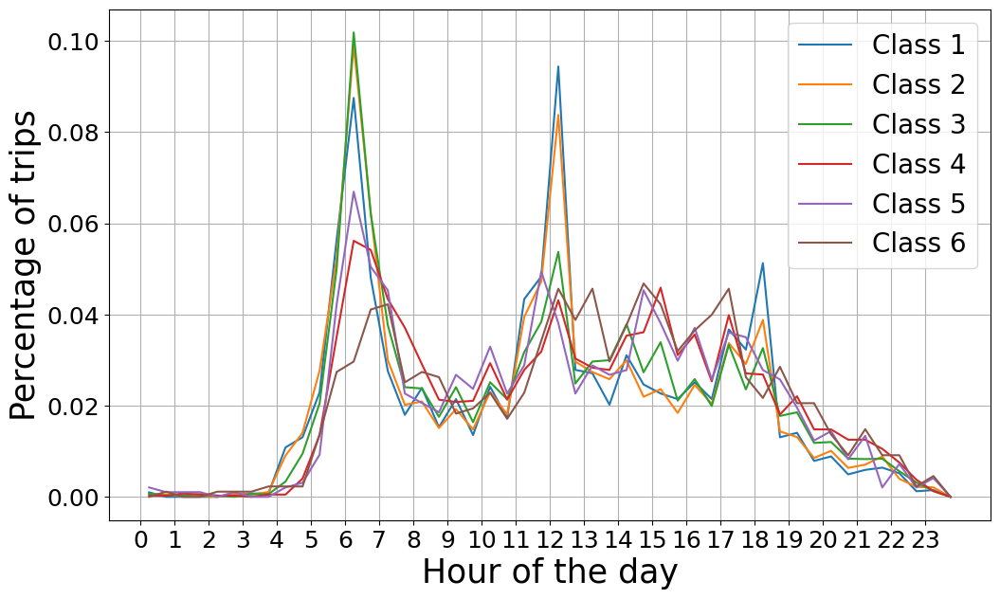

In [44]:
hours = [i/2+1/4 for i in range(48)]
tick = [i for i in range(24)]
plt.figure(figsize = (12, 7))
plt.plot(hours, st[0], label='Class 1')
plt.plot(hours, st[1], label='Class 2')
plt.plot(hours, st[2], label='Class 3')
plt.plot(hours, st[3], label='Class 4')
plt.plot(hours, st[4], label='Class 5')
plt.plot(hours, st[5], label='Class 6')
plt.xlabel('Hour of the day', fontsize = 25)
plt.ylabel('Percentage of trips', fontsize = 25)
plt.yticks(fontsize = 18)
plt.xticks(tick, fontsize = 18)
plt.legend(fontsize = 20)
plt.grid()
plt.show()

In [45]:
num_dis_trips

,zat_origen,zat_destino,Origin Trips,Destination Trips,Org Nodal Strength,Dest Nodal Strength,distance,Trips,s_ij,Theo Trips
0,530.0,551.0,496.0,305.0,978.0,613.0,782.916312,73.0,493.0,9.699975e+01
1,782.0,551.0,459.0,305.0,916.0,613.0,6431.021532,1.0,16860.0,7.884542e-01
2,743.0,551.0,397.0,305.0,799.0,613.0,15521.650471,2.0,105415.0,1.713701e-02
3,553.0,551.0,313.0,305.0,621.0,613.0,1602.353335,13.0,2695.0,9.145340e+00
4,1006.0,551.0,184.0,305.0,363.0,613.0,1644.041830,6.0,2031.0,5.687578e+00
...,...,...,...,...,...,...,...,...,...,...
58926,61.0,1054.0,154.0,1.0,309.0,2.0,8854.206577,1.0,47580.0,4.149727e-05
58927,129.0,478.0,77.0,1.0,152.0,1.0,12150.720646,1.0,122166.0,7.822580e-07
58928,70.0,31.0,61.0,1.0,122.0,2.0,4631.768596,1.0,23709.0,2.620588e-05
58929,367.0,1040.0,70.0,1.0,138.0,2.0,23086.553077,1.0,189489.0,5.372819e-07


## Generalización de las funciones

En esta sección se desarrollaran funciones que solo dependen del dataframe que tenga la estructura tipo num_dis_trips para que calcule las cantidades topologicas de la red dirigida, no dirigida, y el ajuste con los modelos gravitacional y de radiaciones.

In [46]:
# Function that computes the distribution and the cdf of a determinate array or column of a dataframe
def dist_and_ccdf(array):
    x, y = np.unique(np.array(array), return_counts=True)
    y = y/sum(y)
    # Average degree
    avg = np.mean(array)
    # Computing de CCDF of the degree
    ccdf = [sum(y[i:]) for i in range(len(y))]
    dist_array = [x, y, ccdf]
    return dist_array, avg

### Red no dirigida

In [47]:
# Function that returns the degree distribution and the average degree
def non_dir_degree(df):
    # Edge list columns
    edges = ['zat_origen', 'zat_destino']
    edge_list = df[edges]
    # Symmetric edge list
    other_edges = ['zat_destino', 'zat_origen']
    # Converting the directed network to a non-directed
    new_edge_list = edge_list[other_edges].rename(columns={other_edges[0]: edges[0], other_edges[1]: edges[1]})
    edge_list = pd.concat([edge_list, new_edge_list]).drop_duplicates()
    edge_list.loc[0:, ['trips']] = 1
    # Computing the degree of each node
    edge_list = (edge_list.groupby(edges[0], as_index=False)['trips']
                        .agg('sum'))
    # Degree probability
    degree_dist, k_avg = dist_and_ccdf(edge_list['trips'])

    return degree_dist, k_avg

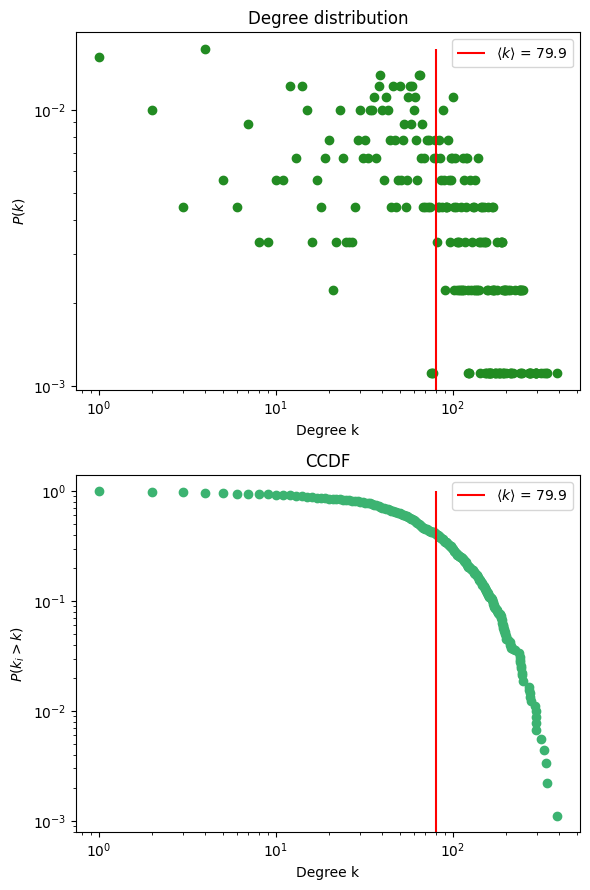

In [48]:
degree_dist, k_avg = non_dir_degree(num_dis_trips)

# Ploting the degree distribution and the CCDF
fig, ax = plt.subplots(2, figsize=(6,9))
ax[0].scatter(degree_dist[0], degree_dist[1], color = 'forestgreen')
ax[0].vlines(k_avg, 0, max(degree_dist[1]), label=r'$\langle k \rangle$ = {}'.format(round(k_avg, 2)), color='r')
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_xlabel('Degree k')
ax[0].set_ylabel(r'$P(k)$')
ax[0].set_title('Degree distribution')
ax[0].legend()

ax[1].scatter(degree_dist[0], degree_dist[2], color = 'mediumseagreen')
ax[1].vlines(k_avg, 0, max(degree_dist[2]), label=r'$\langle k \rangle$ = {}'.format(round(k_avg, 2)), color='r')
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_xlabel('Degree k')
ax[1].set_ylabel(r'$P(k_i>k)$')
ax[1].set_title('CCDF')
ax[1].legend()

plt.tight_layout()
plt.show()

In [49]:
# Function that returns the nodal strength distribution and their mean
def non_dir_strength(df):
    # Nodal strength columns
    str_out_col = ['zat_origen', 'Org Nodal Strength']
    str_out =df[str_out_col]
    str_in_col = ['zat_destino', 'Dest Nodal Strength']
    str_in = df[str_in_col]
    # Merging the total nodal strengths
    str_in = str_in.rename(columns={'zat_destino': 'zat_origen', 'Dest Nodal Strength': 'Org Nodal Strength'})
    nodal_str = pd.concat([str_out, str_in]).drop_duplicates()
    str_array = np.array(nodal_str[str_out_col[1]])
    str_dist, str_avg = dist_and_ccdf(str_array)

    return str_dist, str_avg

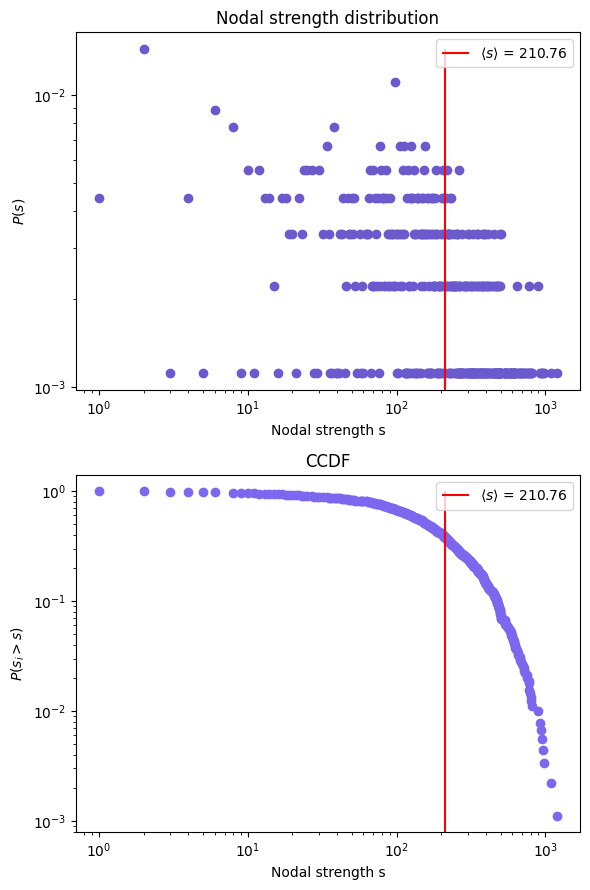

In [50]:
str_dist, str_avg = non_dir_strength(num_dis_trips)

# Ploting the nodal strength distribution and the CCDF
fig, ax = plt.subplots(2, figsize=(6,9))
ax[0].scatter(str_dist[0], str_dist[1], color = 'slateblue')
ax[0].vlines(str_avg, 0, max(str_dist[1]), label=r'$\langle s \rangle$ = {}'.format(round(str_avg, 2)), color='r')
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_xlabel('Nodal strength s')
ax[0].set_ylabel(r'$P(s)$')
ax[0].set_title('Nodal strength distribution')
ax[0].legend()

ax[1].scatter(str_dist[0], str_dist[2], color = 'mediumslateblue')
ax[1].vlines(str_avg, 0, max(str_dist[2]), label=r'$\langle s \rangle$ = {}'.format(round(str_avg, 2)), color='r')
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_xlabel('Nodal strength s')
ax[1].set_ylabel(r'$P(s_i>s)$')
ax[1].set_title('CCDF')
ax[1].legend()

plt.tight_layout()
plt.show()

In [51]:
# Function that returns the link's weight (number of trips between two zones) distribution and the average
def non_dir_weight(df):
    # Nondirected weighted links 
    weigth_1 = ['zat_origen', 'zat_destino', 'Trips']
    weigth_2 = ['zat_destino', 'zat_origen', 'Trips']
    w_list_1 = df[weigth_1]
    w_list_2 = df[weigth_2]

    # Probability of a nondirected weigthed link
    w_list_2 = w_list_2.rename(columns={weigth_2[0]: weigth_1[0], weigth_2[1]: weigth_1[1]})
    w_list = pd.concat([w_list_1, w_list_2])
    w_list = (w_list.groupby([weigth_1[0], weigth_1[1]], as_index=False)['Trips']
                    .agg('sum'))
    w_array = np.array(w_list['Trips'])
    w_dist, w_avg = dist_and_ccdf(w_array)

    return w_dist, w_avg

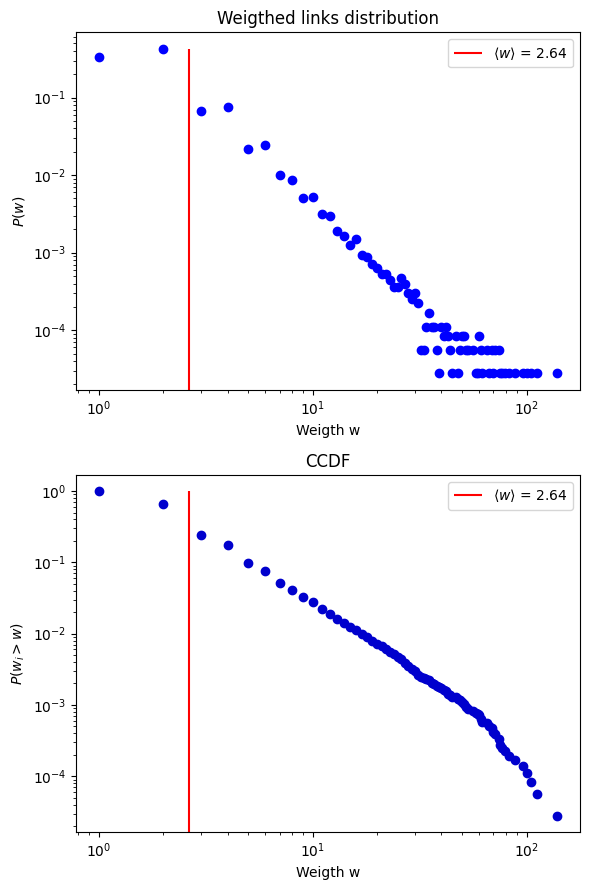

In [52]:
w_dist, w_avg = non_dir_weight(num_dis_trips)

# Ploting the link's weigth distribution and the CCDF
fig, ax = plt.subplots(2, figsize=(6,9))
ax[0].scatter(w_dist[0], w_dist[1], color = 'blue')
ax[0].vlines(w_avg, 0, max(w_dist[1]), label=r'$\langle w \rangle$ = {}'.format(round(w_avg, 2)), color='r')
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_xlabel('Weigth w')
ax[0].set_ylabel(r'$P(w)$')
ax[0].set_title('Weigthed links distribution')
ax[0].legend()

ax[1].scatter(w_dist[0], w_dist[2], color = 'mediumblue')
ax[1].vlines(w_avg, 0, max(w_dist[2]), label=r'$\langle w \rangle$ = {}'.format(round(w_avg, 2)), color='r')
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_xlabel('Weigth w')
ax[1].set_ylabel(r'$P(w_i>w)$')
ax[1].set_title('CCDF')
ax[1].legend()

plt.tight_layout()
plt.show()

### Red dirigida

In [53]:
# Function that returns the in and out nodal strength 
def in_out_strength(df):
    # Calling the columns
    out_columns = ['zat_origen', 'Origin Trips']
    in_columns = ['zat_destino', 'Destination Trips']
    # Calling the df
    out_df = df[out_columns]
    in_df = df[in_columns]
    # Removing repeated values
    out_df = out_df.drop_duplicates()
    in_df = in_df.drop_duplicates()

    out_w_dis, out_w_avg = dist_and_ccdf(out_df['Origin Trips'])
    in_w_dis, in_w_avg = dist_and_ccdf(in_df['Destination Trips'])
    
    return out_w_dis, out_w_avg, in_w_dis, in_w_avg


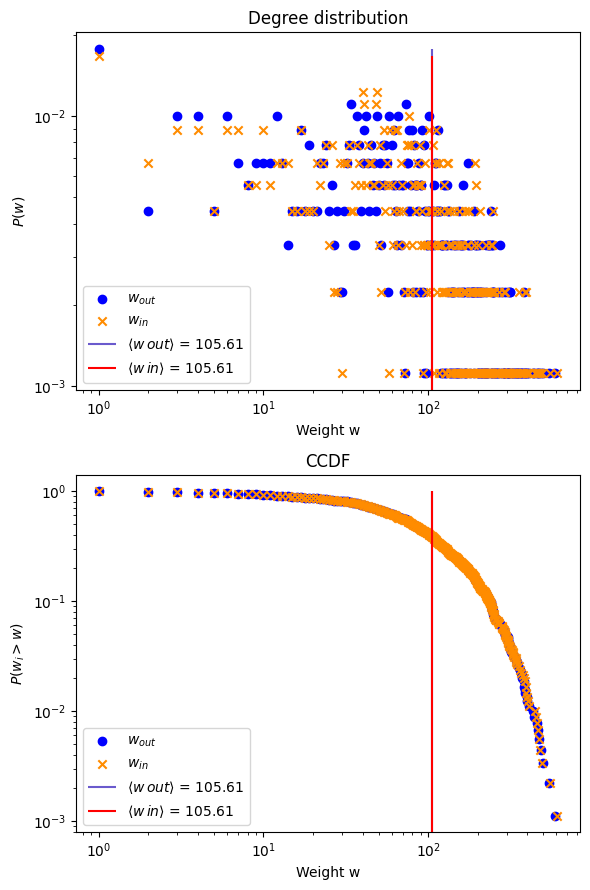

In [54]:
# Computing the deistribution for the in out strength dist and the directed link's weight

out_w_dis, out_w_avg, in_w_dis, in_w_avg = in_out_strength(num_dis_trips)

# out_w_dis, out_w_avg = dist_and_ccdf(num_dis_trips['Origin Trips'])
# in_w_dis, in_w_avg = dist_and_ccdf(num_dis_trips['Destination Trips'])

# Ploting the degree distribution and the CCDF
fig, ax = plt.subplots(2, figsize=(6,9))
ax[0].scatter(out_w_dis[0], out_w_dis[1], color = 'b', label=r'$w_{out}$')
ax[0].scatter(in_w_dis[0], in_w_dis[1], color = 'darkorange', marker='x', label=r'$w_{in}$')
ax[0].vlines(out_w_avg, 0, max(out_w_dis[1]), label=r'$\langle w \, out \rangle$ = {}'.format(round(out_w_avg, 2)), color='slateblue')
ax[0].vlines(in_w_avg, 0, max(in_w_dis[1]), label=r'$\langle w \, in \rangle$ = {}'.format(round(in_w_avg, 2)), color='r')
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_xlabel('Weight w')
ax[0].set_ylabel(r'$P(w)$')
ax[0].set_title('Degree distribution')
ax[0].legend()

ax[1].scatter(out_w_dis[0], out_w_dis[2], color = 'b', label=r'$w_{out}$')
ax[1].scatter(in_w_dis[0], in_w_dis[2], color = 'darkorange', marker='x', label=r'$w_{in}$')
ax[1].vlines(out_w_avg, 0, max(out_w_dis[2]), label=r'$\langle w \, out \rangle$ = {}'.format(round(out_w_avg, 2)), color='slateblue')
ax[1].vlines(in_w_avg, 0, max(in_w_dis[2]), label=r'$\langle w \, in \rangle$ = {}'.format(round(in_w_avg, 2)), color='r')
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_xlabel('Weight w')
ax[1].set_ylabel(r'$P(w_i>w)$')
ax[1].set_title('CCDF')
ax[1].legend()

plt.tight_layout()
plt.show()

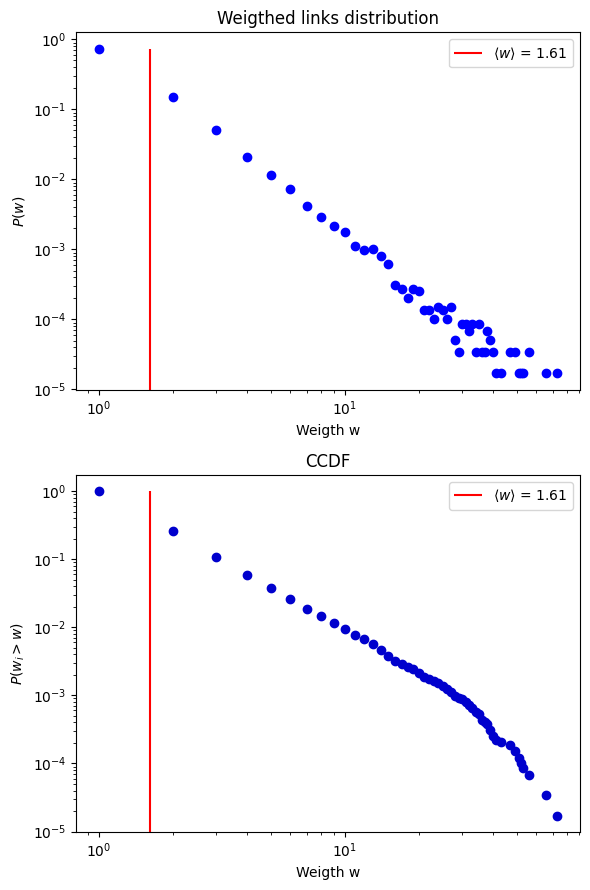

In [55]:
# Computing the distribution of the non directed links 
dir_w_dist, dir_w_avg = dist_and_ccdf(num_dis_trips['Trips'])

# Ploting the  nodal strength distribution and the CCDF
fig, ax = plt.subplots(2, figsize=(6,9))
ax[0].scatter(dir_w_dist[0], dir_w_dist[1], color = 'blue')
ax[0].vlines(dir_w_avg, 0, max(dir_w_dist[1]), label=r'$\langle w \rangle$ = {}'.format(round(dir_w_avg, 2)), color='r')
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_xlabel('Weigth w')
ax[0].set_ylabel(r'$P(w)$')
ax[0].set_title('Weigthed links distribution')
ax[0].legend()

ax[1].scatter(dir_w_dist[0], dir_w_dist[2], color = 'mediumblue')
ax[1].vlines(dir_w_avg, 0, max(dir_w_dist[2]), label=r'$\langle w \rangle$ = {}'.format(round(dir_w_avg, 2)), color='r')
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_xlabel('Weigth w')
ax[1].set_ylabel(r'$P(w_i>w)$')
ax[1].set_title('CCDF')
ax[1].legend()

plt.tight_layout()
plt.show()

### Modelo gravitacional

En esta sección vamos a evaluar la presición con la cual los tres diferentes tipos de modelo gravitacional ajustan con los datos procesados de la encuesta, estos tres modelos son $T_{ij}=\frac{O_iD_j}{R^{\alpha}}$, $T_{ij}=K\frac{O_iD_j}{R^{\alpha}}$ y $T_{ij} = K\frac{(O_iD_j)^{\beta}}{d_{ij}^{\alpha}}$

In [56]:
# Declaring the three diferent versions of the gravitational model

# First gravitational model
def grav_model_1(Data, a):
    O_1, D_2, d = Data
    T = (O_1*D_2)/(d**a)
    T = T/sum(T)
    return T

# Second gravitational model
def grav_model_2(Data, K, a):
    O_1, D_2, d = Data
    T = K*(O_1*D_2)/(d**a)
    T = T/sum(T)
    return T

# Third gravitational model
def grav_model_3(Data, K, a, b):
    O_1, D_2, d = Data
    T = K*(O_1*D_2)**b/(d**a)
    T = T/sum(T)
    return T

In [57]:
def fiting_grav_models(df):
    # Calling the parameters to fit with the model
    origin = np.array(df['Origin Trips'])
    dest = np.array(df['Destination Trips'])
    distance = np.array(df['distance'])
    # Tupple with the free parameters
    data = (origin, dest, distance)

    # Array with the number of non-simetrical (directed) trips between zats
    trips = np.array(df['Trips'])
    trips = trips/sum(trips)

    # Fiting the data with the first model
    popt_1, pcov_1 = curve_fit(grav_model_1, data, trips)
    # Fiting the data with the second model
    popt_2, pcov_2 = curve_fit(grav_model_2, data, trips)
    # Fiting the data with the third model
    popt_3, pcov_3 = curve_fit(grav_model_3, data, trips)

    # Computing the theoretical data
    theo_trips_1 = grav_model_1(data, popt_1[0])
    theo_trips_2 = grav_model_2(data, popt_2[0], popt_2[1])
    theo_trips_3 = grav_model_3(data, popt_3[0], popt_3[1], popt_3[2])

    return trips, theo_trips_1, theo_trips_2, theo_trips_3

In [58]:
# Function that plot the comparation of the model with the real data

def plot_real_theo_grav(trips, theo_trips_1, theo_trips_2, theo_trips_3):
    
    # Seting the minimum and maximum value to plot the identity line
    min_point = (min(trips), min(trips))
    max_point = (max(trips), max(trips))

    # Plotng the comparation
    fig, ax = plt.subplots(3, figsize=(7, 14))

    ax[0].scatter(trips, theo_trips_1, color='mediumseagreen')
    ax[0].set_xscale('log')
    ax[0].set_yscale('log')
    ax[0].set_xlabel('Real data')
    ax[0].set_ylabel('Predicted data')
    ax[0].axline(min_point, max_point)
    ax[0].set_title('Gravitational models')
    ax[0].grid()

    ax[1].scatter(trips, theo_trips_2, color='mediumpurple')
    ax[1].set_xscale('log')
    ax[1].set_yscale('log')
    ax[1].set_xlabel('Real data')
    ax[1].set_ylabel('Predicted data')
    ax[1].axline(min_point, max_point)
    ax[1].grid()


    ax[2].scatter(trips, theo_trips_3, color='salmon')
    ax[2].set_xscale('log')
    ax[2].set_yscale('log')
    ax[2].set_xlabel('Real data')
    ax[2].set_ylabel('Predicted data')
    ax[2].axline(min_point, max_point)
    ax[2].grid()

    plt.tight_layout()
    plt.show()

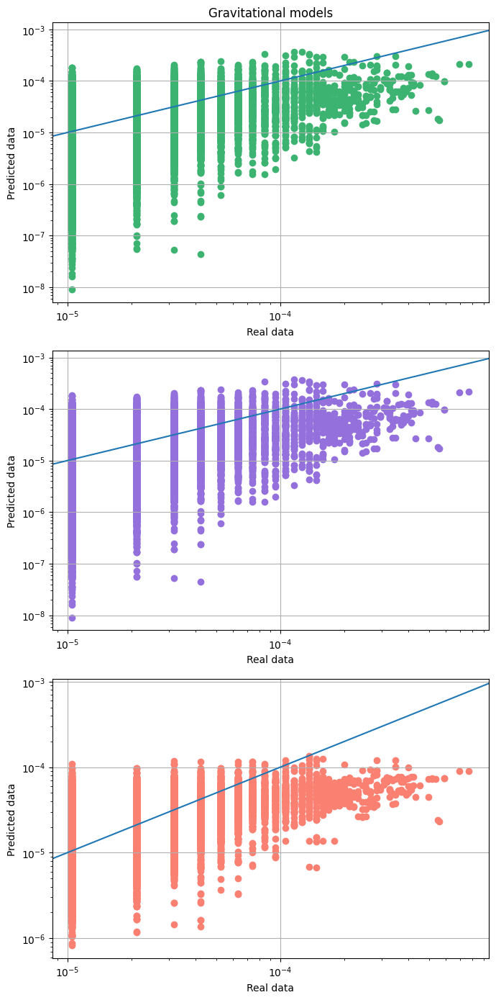

In [59]:
trips, theo_trips_1, theo_trips_2, theo_trips_3 = fiting_grav_models(num_dis_trips)
plot_real_theo_grav(trips, theo_trips_1, theo_trips_2, theo_trips_3)

Antes que nada una breve explicación de que significa cada punto y de mis escalas de medida. Cada punto representa un viaje o un edge no dirigido de la red, el eje x da la probabilidad que tiene ese viaje de suceder segun los datos reales, mientras que el eje y nos dice la probabilidad que tiene ese viaje en particular segun el modelo, y la gracia es que estas dos medidas sean lo mas parecidas entre si, i.e, que al hacer el plot de real probababilities vs predicted probabilities, los datos se acerquen mas a la recta real. 

Tenemos particularmente dos comportamientos bien determinados en los tres modelos gravitacionales propuestos, en el primer y segundo caso se tiene una especie de lucha entre la tendencia y el orden de magnitud, y en el tercer modelo los ordenes de magnitud se mantienen controlados, pero la tendencía no es reproducida.

Teniendo el cuenta los dos primeros modelos, en el caso de los viajes altmente probables (edges muy pesados), vemos que la tendencia de los datos reales es equiparable con la tendencia predicha, pero para el caso de viajes poco probables(edges con un peso de 1 o un poco mas), vemos que el modelo predice que un conjunto considerable de estos viajes son hasta mil veces menos probables que lo que nos dicen los datos reales, lo cual nos dice que existen viajes, no muy numerosos, que el modelo los califica como practicamente imposibles que sucedan. 

En el tercer modelo vemos un comportmiento muy diferente, ya no tenemos esta diferencia tan grande en los ordenes demagnitud, por ejemplo, para los edges de peso uno, el modelo predice que son solo 10 veces menos o mas probables, pero, a medida que la probabilidad de un viaje aumenta segun los datos reales, el modelo no sigue esta endencia, si nos fijamos bien en los viajes o edges cuyo peso es mayor, el modelo predice que son 10 veces menos probables.
Otro comportamiento notable a la hora de revisar este modelo es que no existen probabilidades predichas mayores a $10^{-4}$, siendo esta 10 veces la probabilidad de tener un edge de peso 1, mientras que la cota minima predicha es muy cercana a $10^{-6}$, 10 veces menos a la probabilidad de tener un edge de peso 1. Este comportamineto nos muestra que el modelo presenta una simetría "logaritmica" al rededor de los edges de peso 1, es decir, esta sesgado a predecir todos los edges de peso 1, y los otros otros datos, al no ser tan numerosos no tienen mayor peso a la hora de ajustar los parametros del modelo, por lo cual los datos predichos fuerzan a que los edges mas pesados tengan el comportamiento mas similar a los edges de peso 1. Este fenomeno toma relevancía teniendo en cuenta que del 74% de los edges su peso es 1. 

### Radiation Model

La siguiente tarea es verificar si los datos se ajustan a un modelo de radiaciones, el cual está dado por.

$T_{ij} = T_i\frac{m_im_j}{(m_i+s_{ij})(m_i+m_j+s_{ij})}$

En donde $T_{ij}$ es el flujo de personas entre las zonas $i$ y $j$, $T_i$ el flujo de personas que la zona $i$ emite, $m_i$ y $m_j$ son las poblaciones de las zonas $i$ y $j$, y finalmente $s_{ij}$ se define como el numero de oportunidades entre las zonas $i$ y $j$, y segun la fuente que se use tiene diferentes definiciones, en Barthelemy (2016) $s_{ij}$ es el numero de nodos $w$ tal que $d(i,w)<d(i,j)$, mientras que en Simini et,al (2012), $s_{ij}$ denota la población en un radio dado por la distaincia $r_{ij}$, es decir, $s_{ij}=\sum_{w\neq i,j} m_w$ tal que $d(i,w)<d(i,j)$.
Cabe destacar que este modelo no es simetrico, es decir, $T_{ij}\neq T_{ji}$, a diferencia del modelo gravitacional.

Bueno ya descrito el modelo es hora de pasar a la discusión, como sabemos, nuestros datos no dan razon de la población en ciertas zonas a las que si viaja gente dado que estas zonas son poligonos industriales o tienen otros equipamentos, por lo cual se puede pensar en versiones modificadas del modelo de radiaciones que se adapte a nuestros datos, la primera es, en vez de usar la población $m_i$, se puede usar la fuerza nodal de cada ZAT, se podría usar la fuerza nodal total, la de salida y la de entrada. Como una primera propuesta, teniendo en cuenta que el modelo es antisimetrico por definición, utilizaré $m_i$ como la fuerza nodal total y $s_{ij}$ será la suma de todas las fuerzas nodales entre cada zona.

In [60]:
# Function that computes the predicted values of the radiation model
def radiation_model(df):
    T_i = np.array(df['Origin Trips'])
    m_i = np.array(df['Org Nodal Strength'])
    m_j = np.array(df['Dest Nodal Strength'])
    s_ij = np.array(df['s_ij'])
    T_ij = (m_i*m_j)/((m_i+s_ij)*(m_i+m_j+s_ij))
    T_ij = T_ij/sum(T_ij)
    
    return T_ij

In [61]:
# Ploting the acuracy of the model
def plot_radiation(df, T_ij):
    rad_trips = df['Trips']/sum(df['Trips'])
    min_point = (min(rad_trips), min(rad_trips))
    max_point = (max(rad_trips), max(rad_trips))

    plt.figure()
    plt.scatter(rad_trips, T_ij, color='plum')
    plt.axline(min_point, max_point)
    plt.xlabel('Real trips')
    plt.ylabel('Predicted trips')
    plt.xscale('log')
    plt.yscale('log')
    plt.title('Radiation Model')
    plt.grid()
    plt.show()

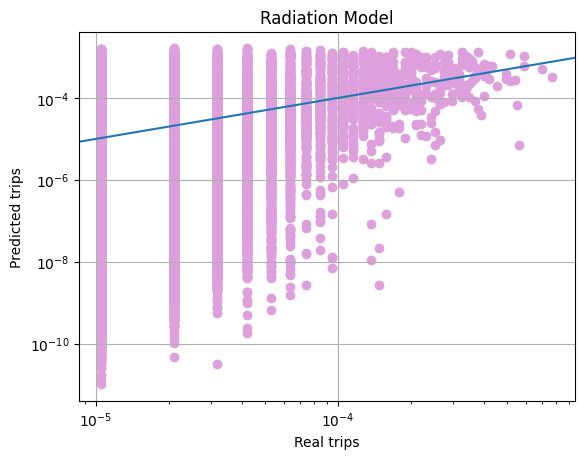

In [62]:
T_ij = radiation_model(num_dis_trips)
plot_radiation(num_dis_trips, T_ij)

In [63]:
(len(num_dis_trips)-len(num_dis_trips[num_dis_trips['Trips']<9]))*100/len(num_dis_trips)

1.1742546367786055

Podemos trazar una frontera a la hora de revisar este modelo en $10^{-4}$, en donde, si un viaje tiene una probabilidad real menor a esta cantidad, las predicciones dadas por el modelo arrojan una diferencia en el orden de magnitud descomunal, por ejemplo, para viajes cuyo peso es 1 y su probabilidad real es $10^{-5}$, el modelo predice probabilidades hasta 100k veces menor a la real. Haciendo una revisión particular de este tipo de viajes, la razón por la que da una probabilidad predicha tan baja, es porque suelen ser viajes entre bordes de la ciudad, en donde la cantidad de "oportunidades" $s_{ij}$ es sumamente grande, en algunos casos abarca las oportunidades de toda la ciudad, razón por la cual, para el modelo de radiaciones este tipo de viajes son inconcevibles. 
Por otra parte, para probabilidades reales mas altas a $10^{-4}$, resulta que, aunque se pueden llegar a ver casos aislados con ordenes de magnitudes de las predicciones son muy diferentes a los valores reales, lo cierto es que se puede notar que el modelo se ajusta de manera mas satisfactoria a los datos, siguen la misma tendencía y los ordenes de magnitud de las predicciones se encuentran acotados entre 100 veces menor y 10 veces mayor. Cabe resaltar que estos viajes que se ajustan bien al modelo solo son un 1,2% de los viajes registrados.

## Analisis por estrato socioeconomico

In [64]:
# Calling the dataframes in function of the socioeconomic level
path_1 = r'./Encuesta de Movilidad 2019/EODH/Archivos_CSV/estrato_1.csv'
path_2 = r'./Encuesta de Movilidad 2019/EODH/Archivos_CSV/estrato_2.csv'
path_3 = r'./Encuesta de Movilidad 2019/EODH/Archivos_CSV/estrato_3.csv'
path_4 = r'./Encuesta de Movilidad 2019/EODH/Archivos_CSV/estrato_4.csv'
path_5 = r'./Encuesta de Movilidad 2019/EODH/Archivos_CSV/estrato_5.csv'
path_6 = r'./Encuesta de Movilidad 2019/EODH/Archivos_CSV/estrato_6.csv'

level_1_df = pd.read_csv(path_1)
level_2_df = pd.read_csv(path_2)
level_3_df = pd.read_csv(path_3)
level_4_df = pd.read_csv(path_4)
level_5_df = pd.read_csv(path_5)
level_6_df = pd.read_csv(path_6)

### Redes no dirigidas

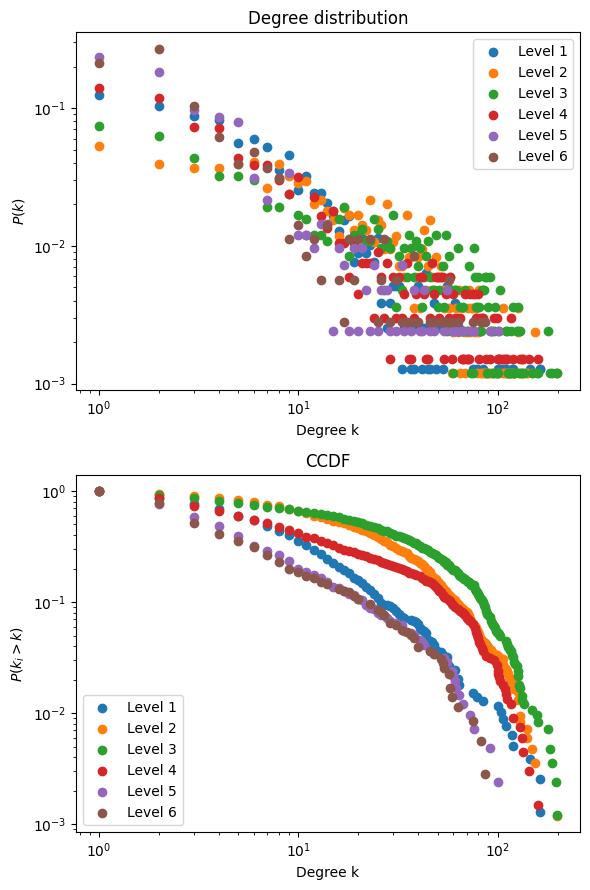

In [65]:
# Mesuring the degree dist of each level network
degree_1, k_1_avg = non_dir_degree(level_1_df)
degree_2, k_2_avg = non_dir_degree(level_2_df)
degree_3, k_3_avg = non_dir_degree(level_3_df)
degree_4, k_4_avg = non_dir_degree(level_4_df)
degree_5, k_5_avg = non_dir_degree(level_5_df)
degree_6, k_6_avg = non_dir_degree(level_6_df)

# Ploting the degree distribution and the CCDF
fig, ax = plt.subplots(2, figsize=(6,9))
ax[0].scatter(degree_1[0], degree_1[1], label='Level 1')
ax[0].scatter(degree_2[0], degree_2[1], label='Level 2')
ax[0].scatter(degree_3[0], degree_3[1], label='Level 3')
ax[0].scatter(degree_4[0], degree_4[1], label='Level 4')
ax[0].scatter(degree_5[0], degree_5[1], label='Level 5')
ax[0].scatter(degree_6[0], degree_6[1], label='Level 6')
# ax[0].vlines(k_1_avg, 0, max(degree_1[1]), label=r'$\langle k_1 \rangle$ = {}'.format(round(k_1_avg, 2)))
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_xlabel('Degree k')
ax[0].set_ylabel(r'$P(k)$')
ax[0].set_title('Degree distribution')
ax[0].legend()

ax[1].scatter(degree_1[0], degree_1[2], label='Level 1')
ax[1].scatter(degree_2[0], degree_2[2], label='Level 2')
ax[1].scatter(degree_3[0], degree_3[2], label='Level 3')
ax[1].scatter(degree_4[0], degree_4[2], label='Level 4')
ax[1].scatter(degree_5[0], degree_5[2], label='Level 5')
ax[1].scatter(degree_6[0], degree_6[2], label='Level 6')
# ax[1].vlines(k_avg, 0, max(degree_dist[2]), label=r'$\langle k \rangle$ = {}'.format(round(k_avg, 2)), color='r')
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_xlabel('Degree k')
ax[1].set_ylabel(r'$P(k_i>k)$')
ax[1].set_title('CCDF')
ax[1].legend()

plt.tight_layout()
plt.show()

In [66]:
# Showing the average degree per level
degree_dict = {'Level 1': k_1_avg, 
               'Level 2': k_2_avg, 
               'Level 3': k_3_avg, 
               'Level 4': k_4_avg,
               'Level 5': k_5_avg,
               'Level 6': k_6_avg,}
degree_dict

{'Level 1': 11.857142857142858,
 'Level 2': 26.334519572953738,
 'Level 3': 33.38516746411483,
 'Level 4': 18.856287425149702,
 'Level 5': 8.226506024096386,
 'Level 6': 7.7126760563380286}

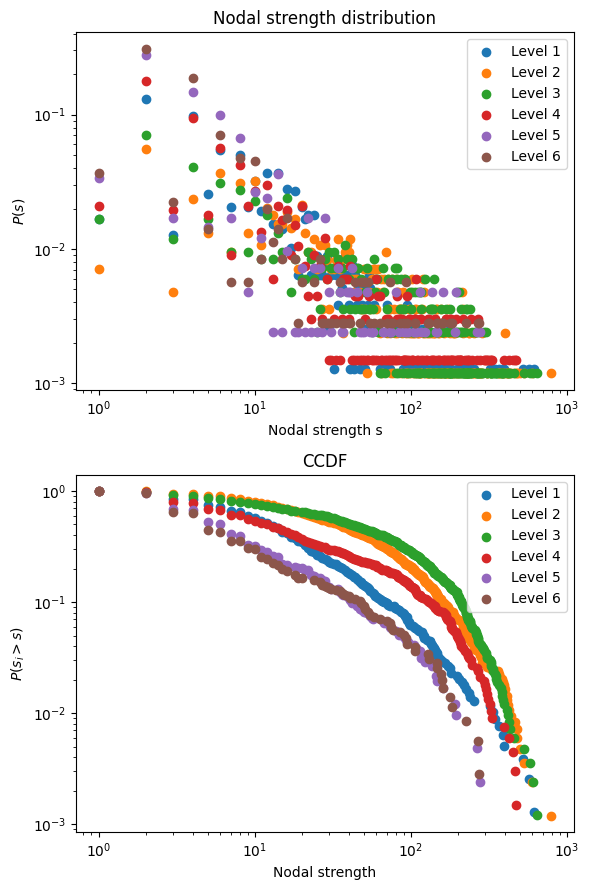

In [67]:
# Nodal strength distribution per each level

strength_1, avg_str_1 = non_dir_strength(level_1_df)
strength_2, avg_str_2 = non_dir_strength(level_2_df)
strength_3, avg_str_3 = non_dir_strength(level_3_df)
strength_4, avg_str_4 = non_dir_strength(level_4_df)
strength_5, avg_str_5 = non_dir_strength(level_5_df)
strength_6, avg_str_6 = non_dir_strength(level_6_df)

# Ploting the nodal strength distribution and the CCDF
fig, ax = plt.subplots(2, figsize=(6,9))
ax[0].scatter(strength_1[0], strength_1[1], label='Level 1')
ax[0].scatter(strength_2[0], strength_2[1], label='Level 2')
ax[0].scatter(strength_3[0], strength_3[1], label='Level 3')
ax[0].scatter(strength_4[0], strength_4[1], label='Level 4')
ax[0].scatter(strength_5[0], strength_5[1], label='Level 5')
ax[0].scatter(strength_6[0], strength_6[1], label='Level 6')
# ax[0].vlines(k_1_avg, 0, max(degree_1[1]), label=r'$\langle k_1 \rangle$ = {}'.format(round(k_1_avg, 2)))
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_xlabel('Nodal strength s')
ax[0].set_ylabel(r'$P(s)$')
ax[0].set_title('Nodal strength distribution')
ax[0].legend()

ax[1].scatter(strength_1[0], strength_1[2], label='Level 1')
ax[1].scatter(strength_2[0], strength_2[2], label='Level 2')
ax[1].scatter(strength_3[0], strength_3[2], label='Level 3')
ax[1].scatter(strength_4[0], strength_4[2], label='Level 4')
ax[1].scatter(strength_5[0], strength_5[2], label='Level 5')
ax[1].scatter(strength_6[0], strength_6[2], label='Level 6')
# ax[1].vlines(k_avg, 0, max(degree_dist[2]), label=r'$\langle k \rangle$ = {}'.format(round(k_avg, 2)), color='r')
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_xlabel('Nodal strength')
ax[1].set_ylabel(r'$P(s_i>s)$')
ax[1].set_title('CCDF')
ax[1].legend()

plt.tight_layout()
plt.show()

In [68]:
# Showing the average strength per level
strength_dict = {'Level 1': avg_str_1, 
               'Level 2': avg_str_2, 
               'Level 3': avg_str_3, 
               'Level 4': avg_str_4,
               'Level 5': avg_str_5,
               'Level 6': avg_str_6}
strength_dict

{'Level 1': 29.445153061224488,
 'Level 2': 65.25978647686833,
 'Level 3': 77.85645933014354,
 'Level 4': 41.84281437125748,
 'Level 5': 17.2,
 'Level 6': 16.892957746478874}

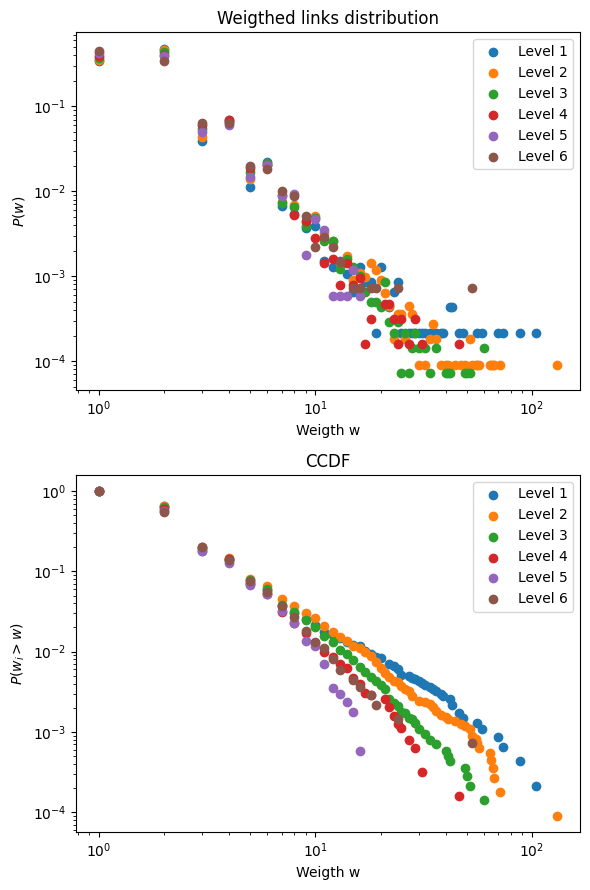

In [69]:
# Links weigth distribution per level

weigth_1, avg_w_1 = non_dir_weight(level_1_df)
weigth_2, avg_w_2 = non_dir_weight(level_2_df)
weigth_3, avg_w_3 = non_dir_weight(level_3_df)
weigth_4, avg_w_4 = non_dir_weight(level_4_df)
weigth_5, avg_w_5 = non_dir_weight(level_5_df)
weigth_6, avg_w_6 = non_dir_weight(level_6_df)

# Ploting the link's weigth distribution and the CCDF
fig, ax = plt.subplots(2, figsize=(6,9))

ax[0].scatter(weigth_1[0], weigth_1[1], label='Level 1')
ax[0].scatter(weigth_2[0], weigth_2[1], label='Level 2')
ax[0].scatter(weigth_3[0], weigth_3[1], label='Level 3')
ax[0].scatter(weigth_4[0], weigth_4[1], label='Level 4')
ax[0].scatter(weigth_5[0], weigth_5[1], label='Level 5')
ax[0].scatter(weigth_6[0], weigth_6[1], label='Level 6')
# ax[0].vlines(k_1_avg, 0, max(degree_1[1]), label=r'$\langle k_1 \rangle$ = {}'.format(round(k_1_avg, 2)))
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_xlabel('Weigth w')
ax[0].set_ylabel(r'$P(w)$')
ax[0].set_title('Weigthed links distribution')
ax[0].legend()

ax[1].scatter(weigth_1[0], weigth_1[2], label='Level 1')
ax[1].scatter(weigth_2[0], weigth_2[2], label='Level 2')
ax[1].scatter(weigth_3[0], weigth_3[2], label='Level 3')
ax[1].scatter(weigth_4[0], weigth_4[2], label='Level 4')
ax[1].scatter(weigth_5[0], weigth_5[2], label='Level 5')
ax[1].scatter(weigth_6[0], weigth_6[2], label='Level 6')
# ax[1].vlines(k_avg, 0, max(degree_dist[2]), label=r'$\langle k \rangle$ = {}'.format(round(k_avg, 2)), color='r')
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_xlabel('Weigth w')
ax[1].set_ylabel(r'$P(w_i>w)$')
ax[1].set_title('CCDF')
ax[1].legend()

plt.tight_layout()
plt.show()

In [70]:
# Showing the average weigth of the links per level
weigth_dict = {'Level 1': avg_w_1, 
               'Level 2': avg_w_2, 
               'Level 3': avg_w_3, 
               'Level 4': avg_w_4,
               'Level 5': avg_w_5,
               'Level 6': avg_w_6}
weigth_dict

{'Level 1': 2.483433734939759,
 'Level 2': 2.478108108108108,
 'Level 3': 2.3320673593694017,
 'Level 4': 2.219117180057161,
 'Level 5': 2.090802577621558,
 'Level 6': 2.1906501095690283}

### Modelo gravitacional

In [71]:
trips_1, theo_trips_1_1, theo_trips_2_1, theo_trips_3_1 = fiting_grav_models(level_1_df)
trips_2, theo_trips_1_2, theo_trips_2_2, theo_trips_3_2 = fiting_grav_models(level_2_df)
trips_3, theo_trips_1_3, theo_trips_2_3, theo_trips_3_3 = fiting_grav_models(level_3_df)
trips_4, theo_trips_1_4, theo_trips_2_4, theo_trips_3_4 = fiting_grav_models(level_4_df)
trips_5, theo_trips_1_5, theo_trips_2_5, theo_trips_3_5 = fiting_grav_models(level_5_df)
trips_6, theo_trips_1_6, theo_trips_2_6, theo_trips_3_6 = fiting_grav_models(level_6_df)

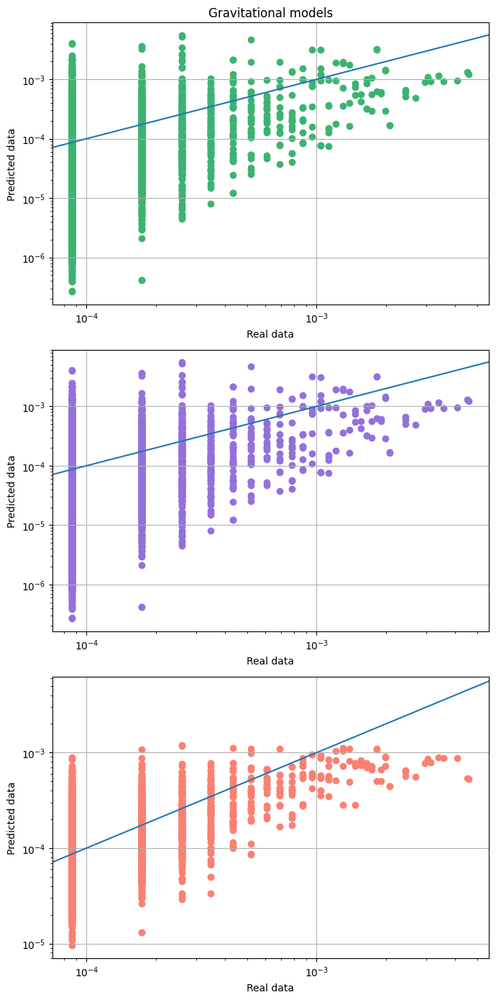

In [72]:
# Gravitational model for level 1
plot_real_theo_grav(trips_1, theo_trips_1_1, theo_trips_2_1, theo_trips_3_1)

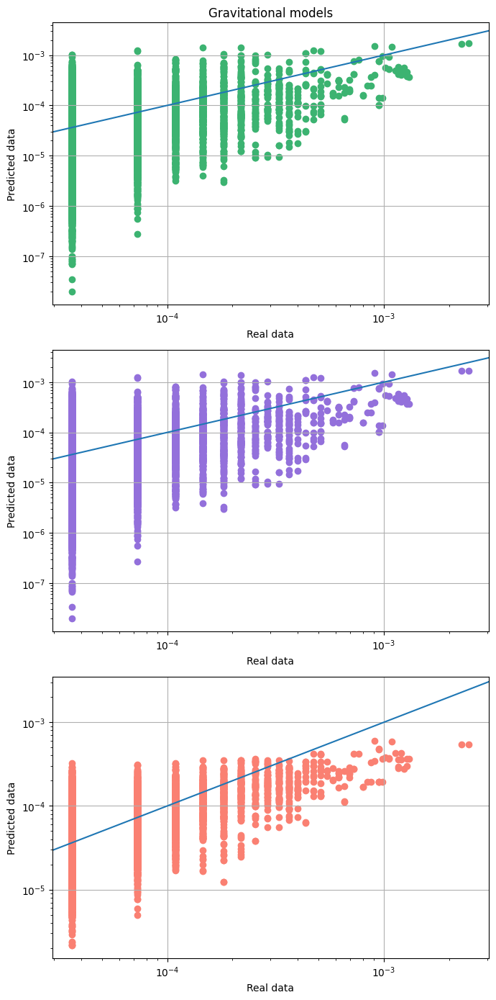

In [73]:
# Gravitational model for level 2
plot_real_theo_grav(trips_2, theo_trips_1_2, theo_trips_2_2, theo_trips_3_2)

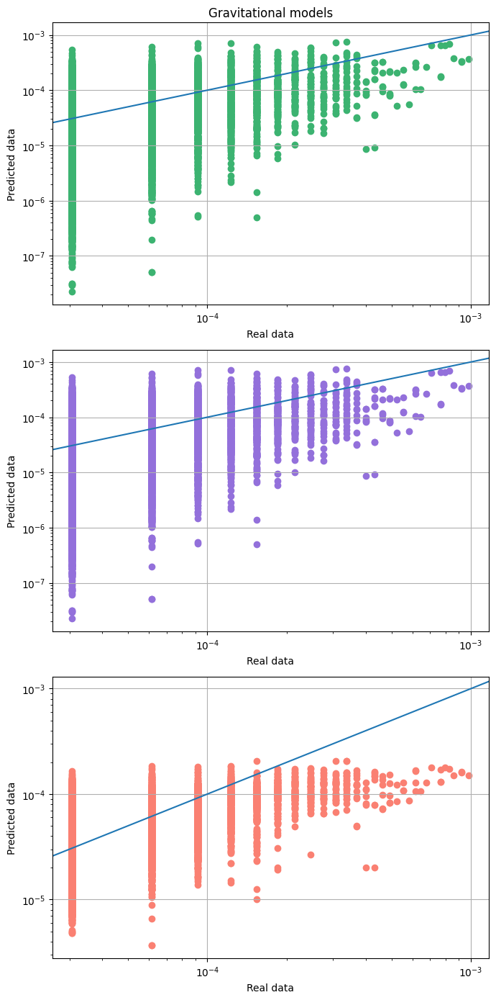

In [74]:
# Gravitational model for level 3
plot_real_theo_grav(trips_3, theo_trips_1_3, theo_trips_2_3, theo_trips_3_3)

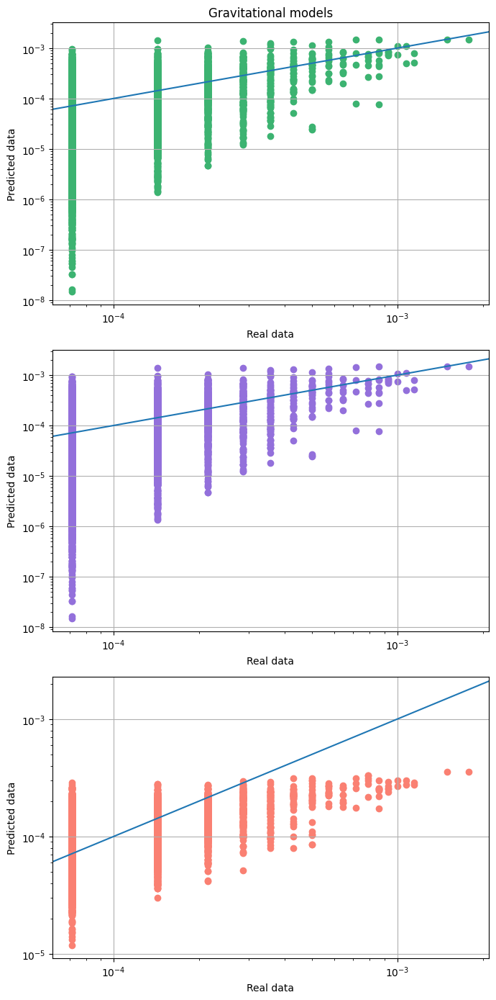

In [75]:
# Gravitational model for level 4
plot_real_theo_grav(trips_4, theo_trips_1_4, theo_trips_2_4, theo_trips_3_4)

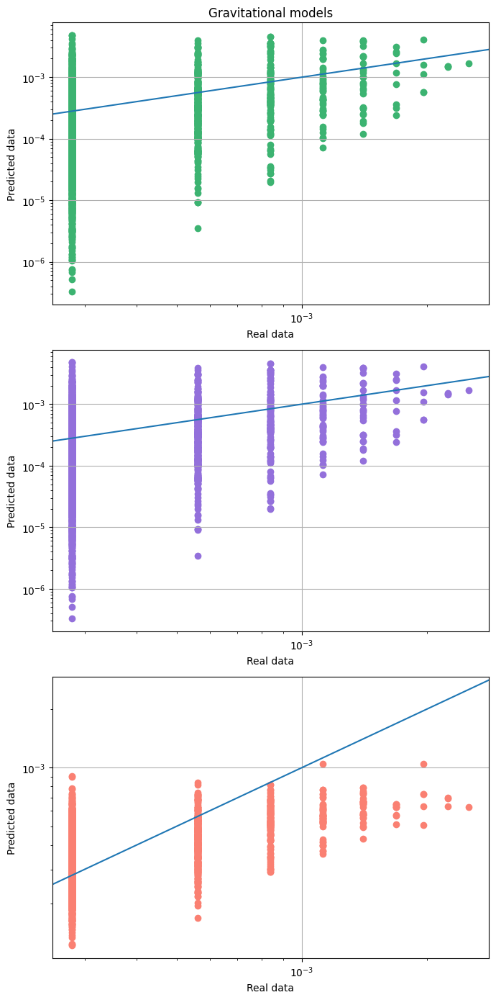

In [76]:
# Gravitational model for level 5
plot_real_theo_grav(trips_5, theo_trips_1_5, theo_trips_2_5, theo_trips_3_5)

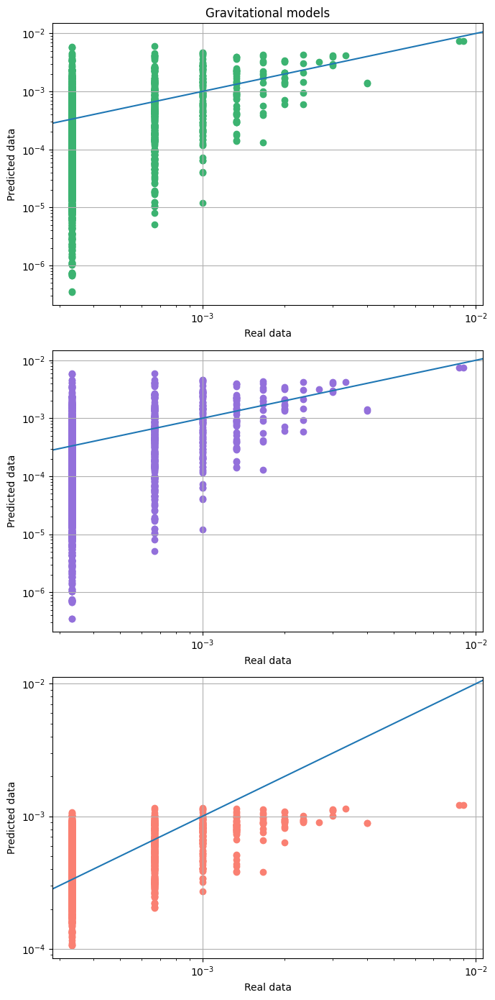

In [77]:
# Gravitational model for level 6
plot_real_theo_grav(trips_6, theo_trips_1_6, theo_trips_2_6, theo_trips_3_6)

#### Discución

### Radiation model

In [78]:
# Computing the predicted values given by the radiation model for each socio economic level
T_ij_1 = radiation_model(level_1_df)
T_ij_2 = radiation_model(level_2_df)
T_ij_3 = radiation_model(level_3_df)
T_ij_4 = radiation_model(level_4_df)
T_ij_5 = radiation_model(level_5_df)
T_ij_6 = radiation_model(level_6_df)

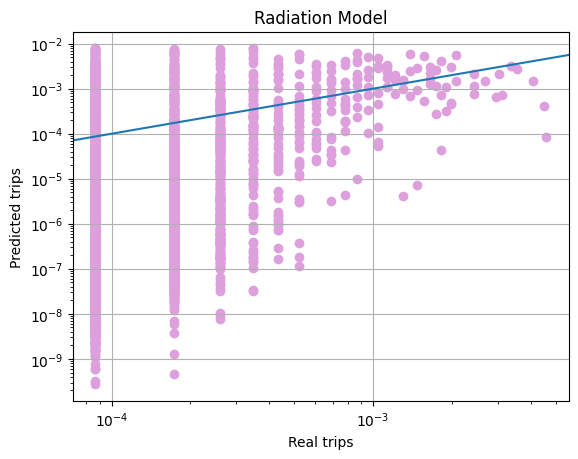

In [79]:
# Ploting the radiation model for the level 
plot_radiation(level_1_df, T_ij_1)

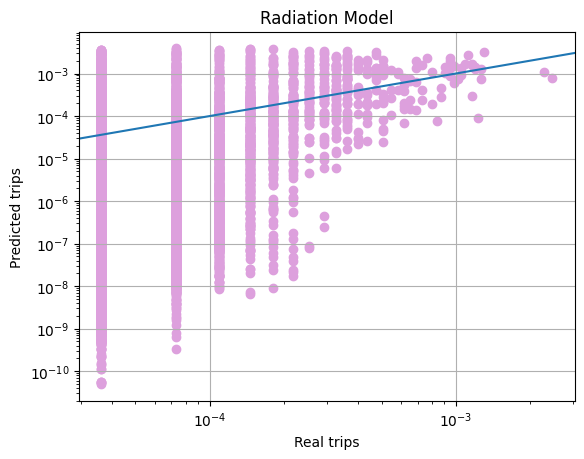

In [80]:
# Ploting the radiation model for the level 
plot_radiation(level_2_df, T_ij_2)

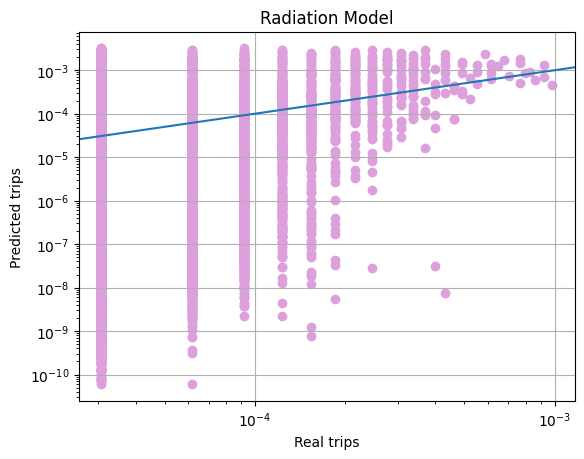

In [81]:
# Ploting the radiation model for the level 
plot_radiation(level_3_df, T_ij_3)

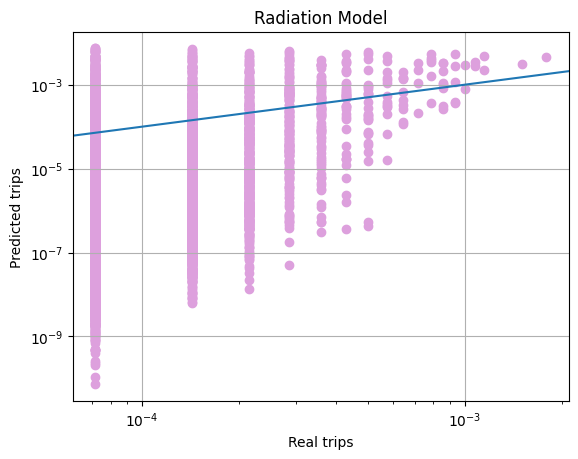

In [82]:
# Ploting the radiation model for the level 
plot_radiation(level_4_df, T_ij_4)

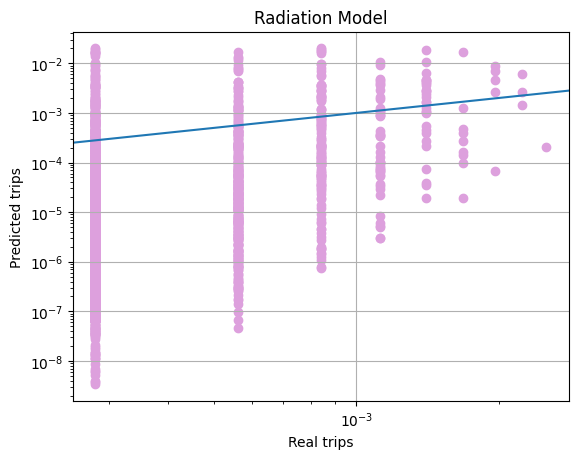

In [83]:
# Ploting the radiation model for the level 
plot_radiation(level_5_df, T_ij_5)

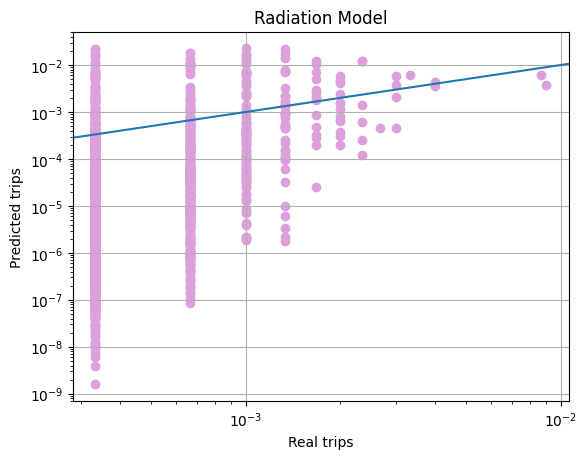

In [84]:
# Ploting the radiation model for the level 
plot_radiation(level_6_df, T_ij_6)

#### Proximas tareas

Porque es bonito, hacer mapas de la fuerza nodal de salida, de entrada y total (Debatible).

Otro metodo es definir cierto threshold, y a partir de este corroborar los modelos, este proceso se puede hacer de diferentes maneras, simplemente cortar los links cuyo peso no llega a dicho threshold, definir un threshold en base al peso nodal, o realizando un proceso de k-cores.

Otro camino puede ser el de tener en cuenta la hora a la que se realiza cada viaje, dado que, dependiendo de la hora los nodos pueden tender mas a ser emisores (barrios residencials) o receptores (lugares de trabajo) y viseversa, por lo cual este framework puede ser útil para detrminar una tendencia clara en el comportamiento de la movilidad.

Conversando los resultados se llego a la conclusión de que estos están teniendo un comportamiento acorde a lo que se encuentra en la literatura. 

El siguiente paso es correr los códigos sobre los datos del 2023 para tener una vista mas acertada de como se encuentra la estructura de la ciudad el día de hoy, aunque existe peligroso, <b> no se pueden comparar los resultados de los ajustes de los modelos mi las caracterizticas topologicas </b>, esto sucede debido a que la ciudad esta divdida de una manera diferente en el 2023, por lo cual se tienen dos grafos diferentes porque no se tiene el mismo conjunto de nodos. Este cambio en los nodos puede generar mejores ajustes de los modelos, cambio en las cantidades topologicas, por ejemplo el grado medio podría crecer, y esto sería consecuencia no de los cambios en el comportamiento de la movilidad dada la pandemia, si no que serían consecuencia de la nueva partición de la ciudad. Para poder comparar de manera correcta hay que asegurarse que estamos trabajando con la misma red, para lo cual hay diferentes maneras de trabajar, ver si hay alguna manera de usar la ubicación GPS de los hogares para actualizar la red del 2019 a las nuevas zats, pero esto no es general porque solo serviría para viajes desde y hacia el hogar, los de mas viajes quedarían relegados, la otra manera es enfocar el estudio detallado de la topologia y los modelos solo para el caso del 2023, y para llevar a cabo comparaciones se pueden utilizar redes cuyos nodos se sabe que no han cambiado, como viajes entre localidades o entre UTAMs.

Algo relevante es que, aunque el analísis tomando el approach de las redes complejas y los viajes origen destino no es comparable (en principio), o requiere de mucho cuidado, cantidades estadisticasdel tipo que  yo trabaje en el proyecto de viajes del SITP si que se pueden comparar y enfocarlas al estrato, tipo tiempos de viaje, uso de tipos de transporte. Para un estudio de distancias y velocidades se debe tenre mucho cuidado por la manera en queyo mido las distancias (linea recta entre centroides de ZATs). 

Comentario de Albert hacer un bining exponencial/logaritmico.